In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

## Import libraries

In [ ]:
import sys
import os

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

from tqdm import tqdm

import keras
from keras.layers import Dense, Convolution1D, MaxPool1D, Flatten, Dropout
from keras.layers import Input, LSTM
from keras.layers import BatchNormalization
from keras.models import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint


# from tensorflow import keras
from tensorflow.keras import layers
import tensorflow as tf


In [ ]:
## seed
np.random.seed(2023)

## Reading CSV data

In [ ]:
raw_data = pd.read_csv('https://raw.githubusercontent.com/mamuncseru/analysis_on_epileptic_seizure_bonn_dataset/main/Epileptic%20Seizure%20Recognition.csv')
raw_data.shape

(11500, 180)

In [ ]:
raw_data

,Unnamed,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X170,X171,X172,X173,X174,X175,X176,X177,X178,y
0,X21.V1.791,135,190,229,223,192,125,55,-9,-33,...,-17,-15,-31,-77,-103,-127,-116,-83,-51,4
1,X15.V1.924,386,382,356,331,320,315,307,272,244,...,164,150,146,152,157,156,154,143,129,1
2,X8.V1.1,-32,-39,-47,-37,-32,-36,-57,-73,-85,...,57,64,48,19,-12,-30,-35,-35,-36,5
3,X16.V1.60,-105,-101,-96,-92,-89,-95,-102,-100,-87,...,-82,-81,-80,-77,-85,-77,-72,-69,-65,5
4,X20.V1.54,-9,-65,-98,-102,-78,-48,-16,0,-21,...,4,2,-12,-32,-41,-65,-83,-89,-73,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11495,X22.V1.114,-22,-22,-23,-26,-36,-42,-45,-42,-45,...,15,16,12,5,-1,-18,-37,-47,-48,2
11496,X19.V1.354,-47,-11,28,77,141,211,246,240,193,...,-65,-33,-7,14,27,48,77,117,170,1
11497,X8.V1.28,14,6,-13,-16,10,26,27,-9,4,...,-65,-48,-61,-62,-67,-30,-2,-1,-8,5
11498,X10.V1.932,-40,-25,-9,-12,-2,12,7,19,22,...,121,135,148,143,116,86,68,59,55,3


In [ ]:
raw_data.values.shape

(11500, 180)

In [ ]:
data = raw_data.values # converted to an numpy array
data = data[:, 1:] # discarding the Unnamed Column
data.shape

(11500, 179)

In [ ]:
# let's see how it looks like
data

array([[135, 190, 229, ..., -83, -51, 4],
       [386, 382, 356, ..., 143, 129, 1],
       [-32, -39, -47, ..., -35, -36, 5],
       ...,
       [14, 6, -13, ..., -1, -8, 5],
       [-40, -25, -9, ..., 59, 55, 3],
       [29, 41, 57, ..., 2, 20, 4]], dtype=object)

In [ ]:
# let's see the type
type(data)

numpy.ndarray

## Classifying data categories as it mentioned in the paper

In [ ]:
df_1 = data[data[:, -1] == 1].astype(int) # seizure
df_2 = data[data[:, -1] == 2].astype(int)
df_3 = data[data[:, -1] == 3].astype(int)
df_4 = data[data[:, -1] == 4].astype(int)
df_5 = data[data[:, -1] == 5].astype(int)

# let's print the shape of each category
print(df_1.shape)
print(df_2.shape)
print(df_3.shape)
print(df_4.shape)
print(df_5.shape)

(2300, 179)
(2300, 179)
(2300, 179)
(2300, 179)
(2300, 179)


## Let's plot some random data points from every category

In [ ]:
def visualize_eeg(number_of_datapoints):
    for i in (np.random.randint(0, 2300, number_of_datapoints)):
        plt.plot(df_1[i, :], 'r-', label='df_1')
        plt.plot(df_2[i, :], 'g-', label='df_2')
        plt.plot(df_3[i, :], 'k-', label='df_3')
        plt.plot(df_4[i, :], 'b-', label='df_4')
        plt.plot(df_5[i, :], 'm-', label='df_5')
        plt.legend()
        plt.title(f'visualizing {i} th data point')
        plt.xlabel('time')
        plt.ylabel('aplitude(uV)')
        plt.show()

### Visualizing all categories in single figure

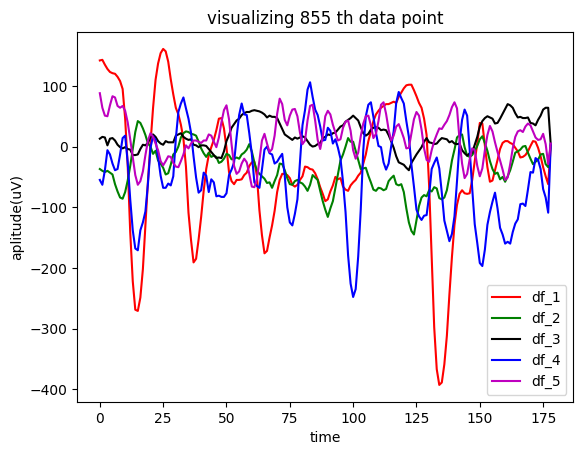

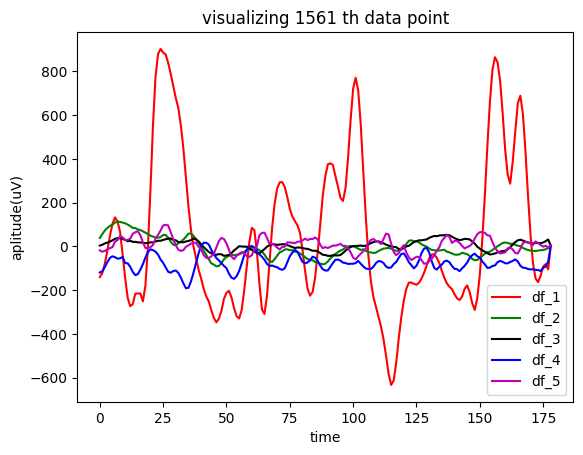

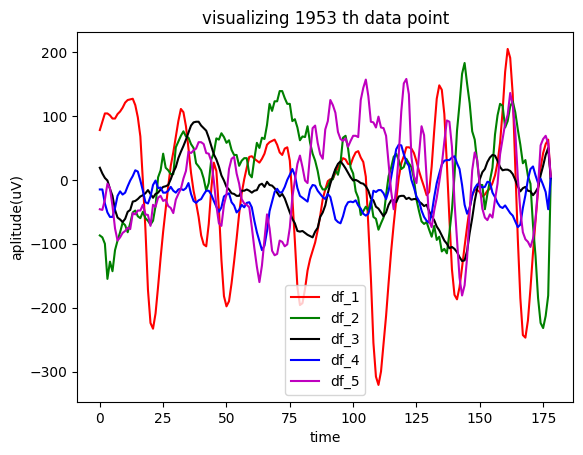

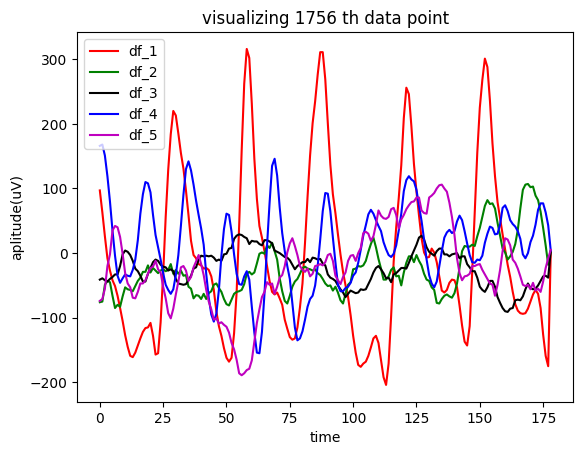

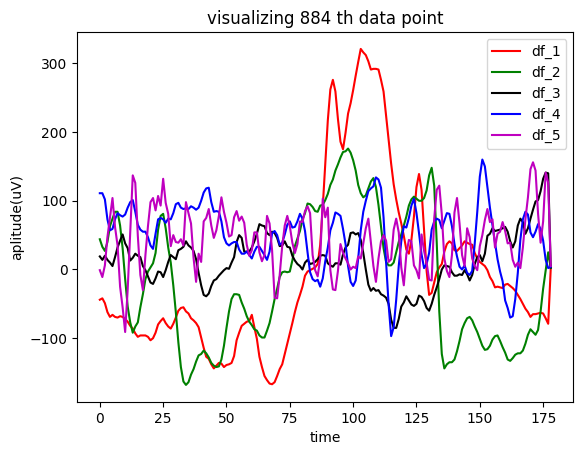

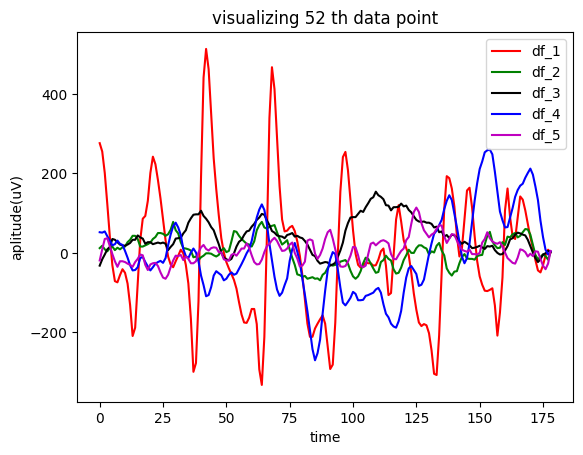

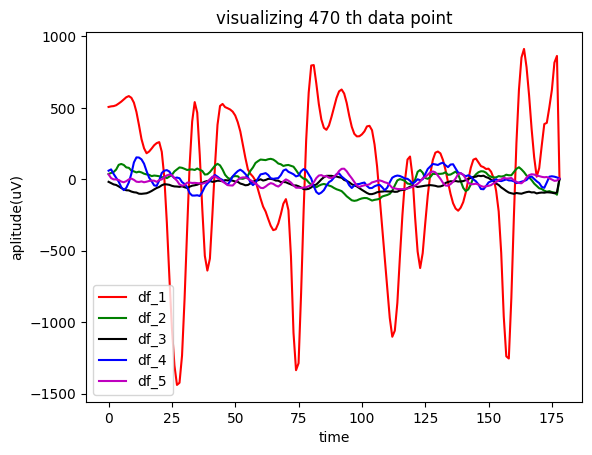

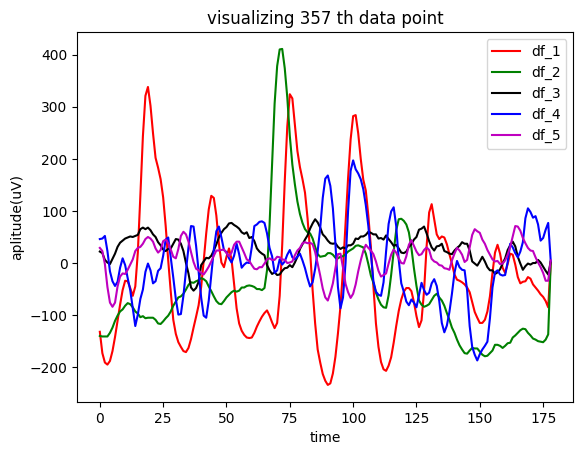

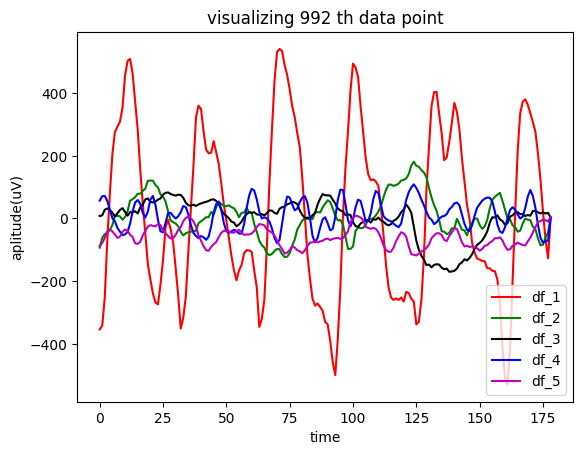

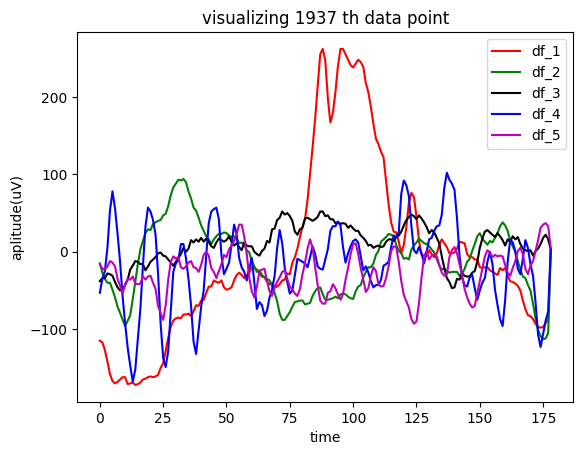

In [ ]:
### all categories
visualize_eeg(10)

## Converting data into integer and making the data into seizure and non-seizure cateogry

In [ ]:
all_data = data.copy().astype('int')

In [ ]:
all_data

array([[135, 190, 229, ..., -83, -51,   4],
       [386, 382, 356, ..., 143, 129,   1],
       [-32, -39, -47, ..., -35, -36,   5],
       ...,
       [ 14,   6, -13, ...,  -1,  -8,   5],
       [-40, -25,  -9, ...,  59,  55,   3],
       [ 29,  41,  57, ...,   2,  20,   4]])

In [ ]:
all_data[:, -1] = np.where(all_data[:, -1] != 1, 0, all_data[:, -1])
all_data

array([[135, 190, 229, ..., -83, -51,   0],
       [386, 382, 356, ..., 143, 129,   1],
       [-32, -39, -47, ..., -35, -36,   0],
       ...,
       [ 14,   6, -13, ...,  -1,  -8,   0],
       [-40, -25,  -9, ...,  59,  55,   0],
       [ 29,  41,  57, ...,   2,  20,   0]])

In [ ]:
print(len(all_data[all_data[:, -1] == 1]))
print(len(all_data[all_data[:, -1] == 0]))

2300
9200


## Merge and Split dataset for training, validation and testing (80%:10%:10%)

In [ ]:
def split_data(data, random_state=2023):

    X = all_data[:, :-1]
    y = all_data[:, -1]

    X_train, X_valtest, y_train, y_valtest = train_test_split(X, y, stratify=y, test_size=.2, random_state=random_state)
    X_val, X_test, y_val, y_test = train_test_split(X_valtest, y_valtest, stratify=y_valtest, test_size=.5, random_state=random_state)

    return X_train, X_val, X_test, y_train, y_val, y_test



In [ ]:
X_train, X_val, X_test, y_train, y_val, y_test = split_data(all_data)
print(X_train.shape)
print(X_val.shape)
print(X_test.shape)
print(y_train.shape)
print(y_val.shape)
print(y_test.shape)

(9200, 178)
(1150, 178)
(1150, 178)
(9200,)
(1150,)
(1150,)


### let's expand the dimension to fit the data for CNN modelling

In [ ]:
X_train = np.expand_dims(X_train, axis=2)
X_val = np.expand_dims(X_val, axis=2)
X_test = np.expand_dims(X_test, axis=2)

print(X_train.shape)
print(X_val.shape)
print(X_test.shape)

(9200, 178, 1)
(1150, 178, 1)
(1150, 178, 1)


In [ ]:
input_shape = (X_train.shape[1], 1)

X_train = X_train.astype('float32')
X_val = X_val.astype('float32')

y_train = y_train.astype('float32')
y_val = y_val.astype('float32')

## Defining the CNN network architecture

## Model 1

without activation function and validation set it performs worst...

In [ ]:
class eegClassifier(keras.Model):
    def __init__(self, input_shape):
        super(eegClassifier, self).__init__()

        # self.im_shape = (X_train.shape[1], 1)
        # self.inputs_cnn = Input(shape=(im_shape), name='inputs_cnn')

        self.conv1 = layers.Conv1D(filters=32, kernel_size=6, input_shape=input_shape)
        self.bn_1 = BatchNormalization()
        self.max_pool_1 = layers.MaxPooling1D(2, padding='same')

        self.conv2 = layers.Conv1D(filters=64, kernel_size=3)
        self.bn_2 = BatchNormalization()
        self.max_pool_2 = layers.MaxPooling1D(2, padding='same')


        self.flatten = Flatten()

        self.dense_1 = Dense(32)
        self.dense_2 = Dense(16)

        self.output_dense = Dense(2)

    def call(self, inputs):
        print('I am here entered...')
        x = self.conv1(inputs)
        print('printing the shape: ', x.shape)
        x = self.max_pool_1(self.bn_1(x))
        x = self.conv2(x)
        x = self.max_pool_2(self.bn_2(x))

        x = self.flatten(x)
        x = self.dense_1(x)
        x = self.dense_2(x)
        return self.output_dense(x)

input_shape = (X_train.shape[1], 1)
model = eegClassifier(input_shape)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
X_train = X_train.astype('float32')
y_train = y_train.astype('int32')

In [ ]:
history = model.fit(X_train, y_train, epochs=50)

Epoch 1/50
I am here entered...
printing the shape:  (None, 173, 32)
I am here entered...
printing the shape:  (None, 173, 32)
288/288 [==============================] - 5s 5ms/step - loss: 0.8448 - accuracy: 0.8045
Epoch 2/50
288/288 [==============================] - 2s 5ms/step - loss: 0.7180 - accuracy: 0.8528
Epoch 3/50
288/288 [==============================] - 2s 5ms/step - loss: 0.7076 - accuracy: 0.8610
Epoch 4/50
288/288 [==============================] - 2s 5ms/step - loss: 0.7044 - accuracy: 0.8611
Epoch 5/50
288/288 [==============================] - 2s 5ms/step - loss: 0.7092 - accuracy: 0.8605
Epoch 6/50
288/288 [==============================] - 2s 5ms/step - loss: 0.7076 - accuracy: 0.8587
Epoch 7/50
288/288 [==============================] - 2s 7ms/step - loss: 0.7266 - accuracy: 0.8297
Epoch 8/50
288/288 [==============================] - 2s 6ms/step - loss: 0.7045 - accuracy: 0.8040
Epoch 9/50
288/288 [==============================] - 2s 5ms/step - loss: 0.7463 - a

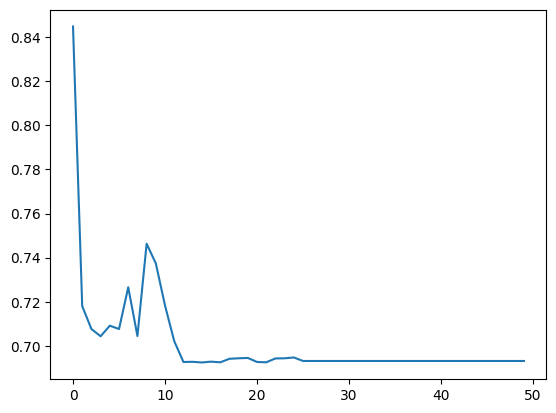

In [ ]:
plt.plot(history.history['loss'])

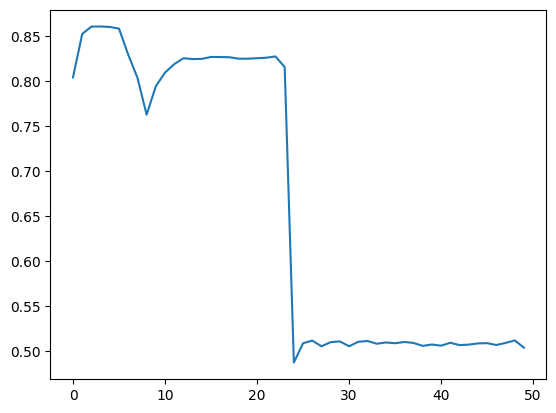

In [ ]:
plt.plot(history.history['accuracy'])

## Model 2

In [ ]:
class eegClassifier(keras.Model):
    def __init__(self, input_shape):
        super(eegClassifier, self).__init__()

        # self.im_shape = (X_train.shape[1], 1)
        # self.inputs_cnn = Input(shape=(im_shape), name='inputs_cnn')

        self.conv1 = layers.Conv1D(filters=32, kernel_size=6, input_shape=input_shape)
        self.bn_1 = BatchNormalization()
        self.max_pool_1 = layers.MaxPooling1D(2, padding='same')

        self.conv2 = layers.Conv1D(filters=64, kernel_size=3)
        self.bn_2 = BatchNormalization()
        self.max_pool_2 = layers.MaxPooling1D(2, padding='same')

        self.flatten = Flatten()

        self.dense_1 = Dense(32)
        self.dense_2 = Dense(16)

        self.output_dense = Dense(2, activation='softmax')

    def call(self, inputs):
        x = self.conv1(inputs)
        x = tf.nn.relu(self.bn_1(x))
        x = self.max_pool_1(x)

        x = self.conv2(x)
        x = tf.nn.relu(self.bn_2(x))
        x = self.max_pool_2(x)

        x = self.flatten(x)
        x = self.dense_1(x)
        x = tf.nn.relu(x)
        x = self.dense_2(x)
        x = tf.nn.relu(x)
        return self.output_dense(x)

input_shape = (X_train.shape[1], 1)
model = eegClassifier(input_shape)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
X_train = X_train.astype('float32')
X_val = X_val.astype('float32')

y_train = y_train.astype('int32')
y_val = y_val.astype('int32')

In [ ]:
history2 = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)

Epoch 1/100
288/288 [==============================] - 6s 6ms/step - loss: 0.1484 - accuracy: 0.9413 - val_loss: 0.1231 - val_accuracy: 0.9600
Epoch 2/100
288/288 [==============================] - 2s 6ms/step - loss: 0.1108 - accuracy: 0.9548 - val_loss: 0.2029 - val_accuracy: 0.9348
Epoch 3/100
288/288 [==============================] - 2s 6ms/step - loss: 0.1041 - accuracy: 0.9614 - val_loss: 0.1014 - val_accuracy: 0.9591
Epoch 4/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0800 - accuracy: 0.9672 - val_loss: 0.0888 - val_accuracy: 0.9678
Epoch 5/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0799 - accuracy: 0.9695 - val_loss: 0.0891 - val_accuracy: 0.9617
Epoch 6/100
288/288 [==============================] - 2s 7ms/step - loss: 0.0678 - accuracy: 0.9746 - val_loss: 0.0792 - val_accuracy: 0.9704
Epoch 7/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0557 - accuracy: 0.9800 - val_loss: 0.0662 - val_accuracy: 0.9783

### function to plot loss curve of the training and validation loss


In [ ]:
def plot_loss(history):
    plt.plot(history.history['loss'], 'b-')
    plt.plot(history.history['val_loss'], 'r-')
    plt.legend(['loss', 'val_loss'])
    plt.title('Loss curve')
    plt.xlabel('Epochs')
    plt.ylabel('Loss %')
    plt.show()

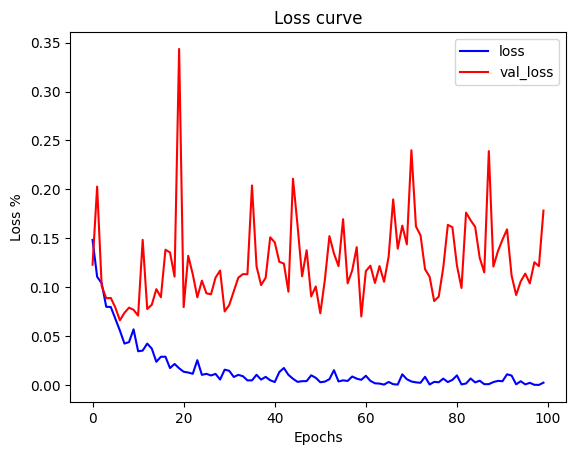

In [ ]:
plot_loss(history2)

### function to plot accuracy curve of the training and validation accuracy


In [ ]:
def plot_accuracy(history):
    plt.plot(history.history['accuracy'], 'b-')
    plt.plot(history.history['val_accuracy'], 'r-')
    plt.legend(['accuracy', 'val_accuracy'])
    plt.title('Accuracy curve')
    plt.xlabel('Epochs')
    plt.ylabel('accuracy %')
    plt.show()

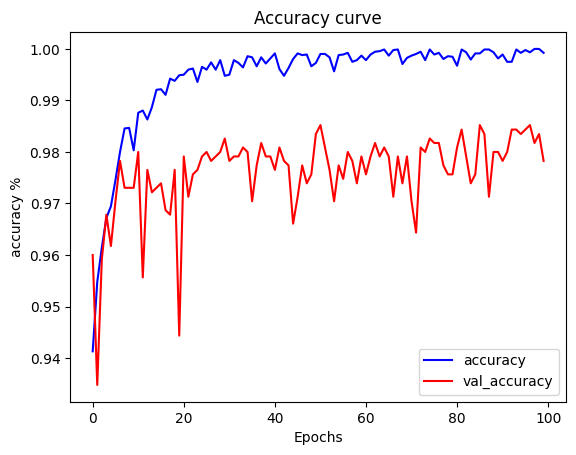

In [ ]:
plot_accuracy(history2)

## Let's experiment with the number of units in conv1, conv2 layers

```
conv1 = [32, 64, 128, 256, 512]

conv2 = [64, 128, 256, 512, 1024]
```


### Experimental Model

In [ ]:
class eegClassifier(keras.Model):
    def __init__(self, input_shape, c1_units, c2_units):
        super(eegClassifier, self).__init__()

        # self.im_shape = (X_train.shape[1], 1)
        # self.inputs_cnn = Input(shape=(im_shape), name='inputs_cnn')

        self.conv1 = layers.Conv1D(filters=c1_units, kernel_size=6, input_shape=input_shape)
        self.bn_1 = BatchNormalization()
        self.max_pool_1 = layers.MaxPooling1D(2, padding='same')

        self.conv2 = layers.Conv1D(filters=c2_units, kernel_size=3)
        self.bn_2 = BatchNormalization()
        self.max_pool_2 = layers.MaxPooling1D(2, padding='same')

        self.flatten = Flatten()

        self.dense_1 = Dense(32)
        self.dense_2 = Dense(16)

        self.output_dense = Dense(2, activation='softmax')

    def call(self, inputs):
        x = self.conv1(inputs)
        x = tf.nn.relu(self.bn_1(x))
        x = self.max_pool_1(x)

        x = self.conv2(x)
        x = tf.nn.relu(self.bn_2(x))
        x = self.max_pool_2(x)

        x = self.flatten(x)
        x = self.dense_1(x)
        x = tf.nn.relu(x)
        x = self.dense_2(x)
        x = tf.nn.relu(x)
        return self.output_dense(x)

input_shape = (X_train.shape[1], 1)

X_train = X_train.astype('float32')
X_val = X_val.astype('float32')

y_train = y_train.astype('int32')
y_val = y_val.astype('int32')

In [ ]:
conv1 = [32, 64, 128, 256, 512]
conv2 = [64, 128, 256, 512, 1024]


all_history = []
all_models = []

for c1_units in conv1:
    for c2_units in conv2:
        model = eegClassifier(input_shape, c1_units, c2_units)
        model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        print('\n\n\n')
        print(f'---- conv1 unit = {c1_units} ---- conv2 unit = {c2_units}-------')
        history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)
        all_models.append(model)
        print('\n\n')
        print(model.summary())
        print('\n')
        plot_loss(history)
        plot_accuracy(history)

        all_history.append(history)


In [ ]:
for history in all_history:
    plot_loss(history)
    plot_accuracy(history)


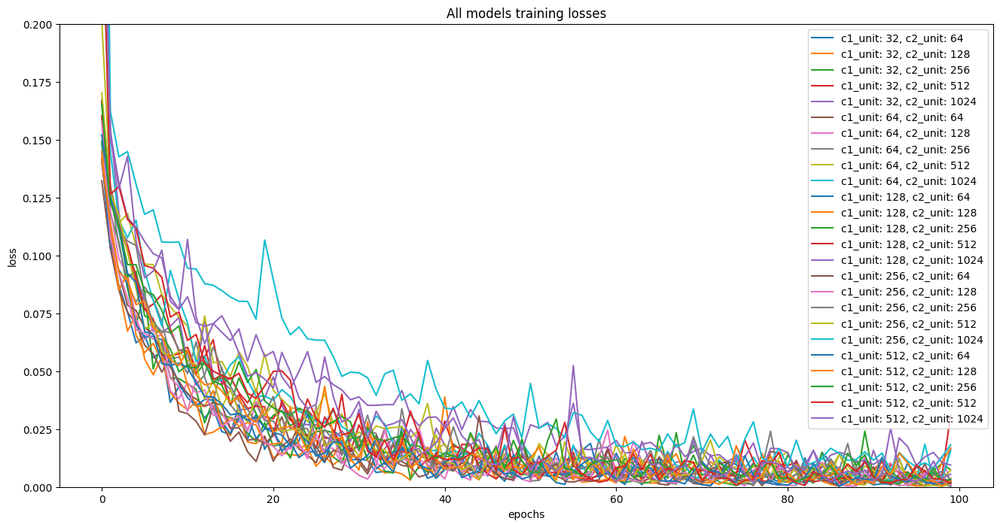

In [ ]:
i = 0
plt.figure(figsize=(16, 8))
for c1_units in conv1:
    for c2_units in conv2:
        plt.plot(all_history[i].history['loss'], label=f'c1_unit: {c1_units}, c2_unit: {c2_units}')
        i = i + 1

plt.title('All models training losses')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.ylim([0, 0.2])
plt.show()

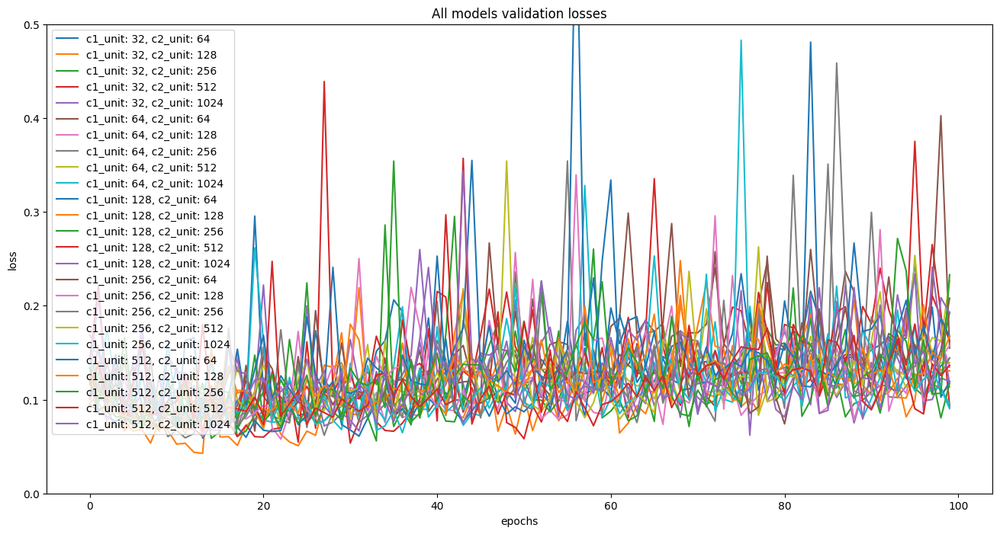

In [ ]:
i = 0
plt.figure(figsize=(16, 8))
for c1_units in conv1:
    for c2_units in conv2:
        plt.plot(all_history[i].history['val_loss'], label=f'c1_unit: {c1_units}, c2_unit: {c2_units}')
        i = i + 1

plt.title('All models validation losses')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.ylim([0, 0.5])
plt.show()

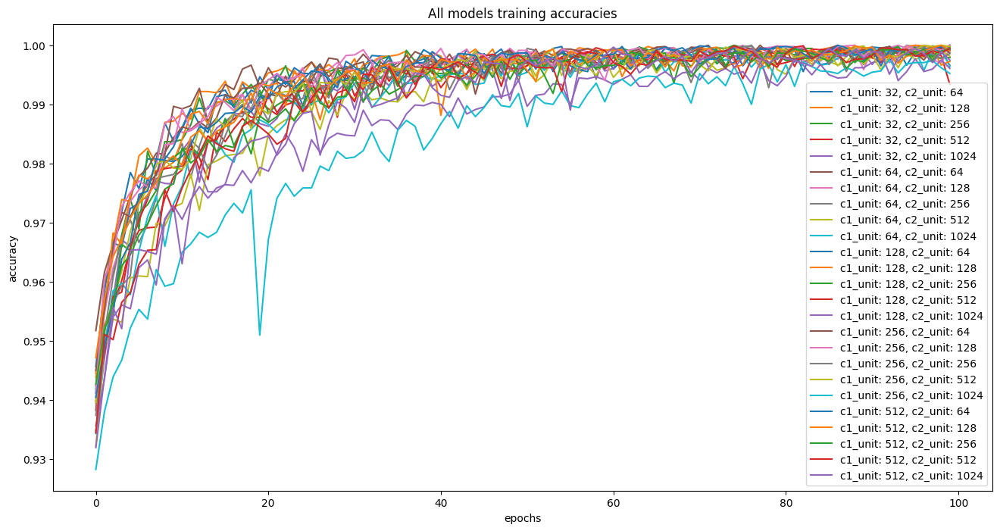

In [ ]:
i = 0
plt.figure(figsize=(16, 8))
for c1_units in conv1:
    for c2_units in conv2:
        plt.plot(all_history[i].history['accuracy'], label=f'c1_unit: {c1_units}, c2_unit: {c2_units}')
        i = i + 1

plt.title('All models training accuracies')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

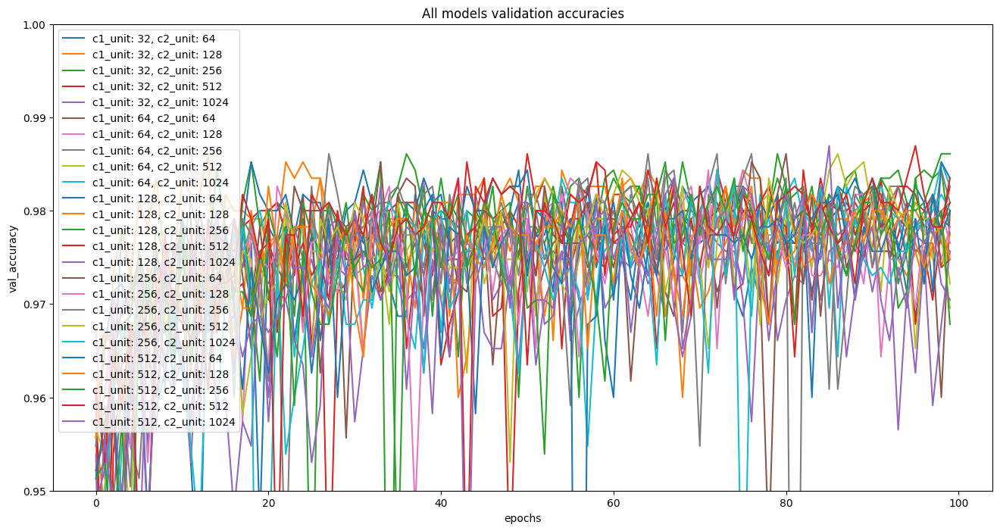

In [ ]:
i = 0
plt.figure(figsize=(16, 8))
for c1_units in conv1:
    for c2_units in conv2:
        plt.plot(all_history[i].history['val_accuracy'], label=f'c1_unit: {c1_units}, c2_unit: {c2_units}')
        i = i + 1

plt.title('All models validation accuracies')
plt.xlabel('epochs')
plt.ylabel('val_accuracy')
plt.legend()
plt.ylim([.95, 1])
plt.show()

## Let's experiment with the number of units in dense1, dense2 layers

```
dense1 = [32, 64, 128, 256, 512, 1024]

dense2 = [16, 32, 64, 128, 256, 512]
```


In [ ]:
class eegClassifier(keras.Model):
    def __init__(self, input_shape, d1_units, d2_units):
        super(eegClassifier, self).__init__()

        self.conv1 = layers.Conv1D(filters=128, kernel_size=6, input_shape=input_shape)
        self.bn_1 = BatchNormalization()
        self.max_pool_1 = layers.MaxPooling1D(2, padding='same')

        self.conv2 = layers.Conv1D(filters=512, kernel_size=3)
        self.bn_2 = BatchNormalization()
        self.max_pool_2 = layers.MaxPooling1D(2, padding='same')

        self.flatten = Flatten()

        self.dense_1 = Dense(d1_units)
        self.dense_2 = Dense(d2_units)

        self.output_dense = Dense(2, activation='softmax')

    def call(self, inputs):
        x = self.conv1(inputs)
        x = tf.nn.relu(self.bn_1(x))
        x = self.max_pool_1(x)

        x = self.conv2(x)
        x = tf.nn.relu(self.bn_2(x))
        x = self.max_pool_2(x)

        x = self.flatten(x)
        x = self.dense_1(x)
        x = tf.nn.relu(x)
        x = self.dense_2(x)
        x = tf.nn.relu(x)
        return self.output_dense(x)


In [ ]:
dense1 = [32, 64, 128, 256, 512, 1024]

dense2 = [16, 32, 64, 128, 256, 512]


all_dense_history = []
all_dense_models = []

for d1_units in dense1:
    for d2_units in dense2:
        model = eegClassifier(input_shape, d1_units, d2_units)
        model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        print('\n\n\n')
        print(f'---- dense1 unit = {d1_units} ---- dense2 unit = {d2_units}-------')
        history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)
        all_dense_models.append(model)
        print('\n\n')
        print(model.summary())
        print('\n')
        plot_loss(history)
        plot_accuracy(history)

        all_dense_history.append(history)


In [ ]:
for history in all_dense_history:
    plot_loss(history)
    plot_accuracy(history)


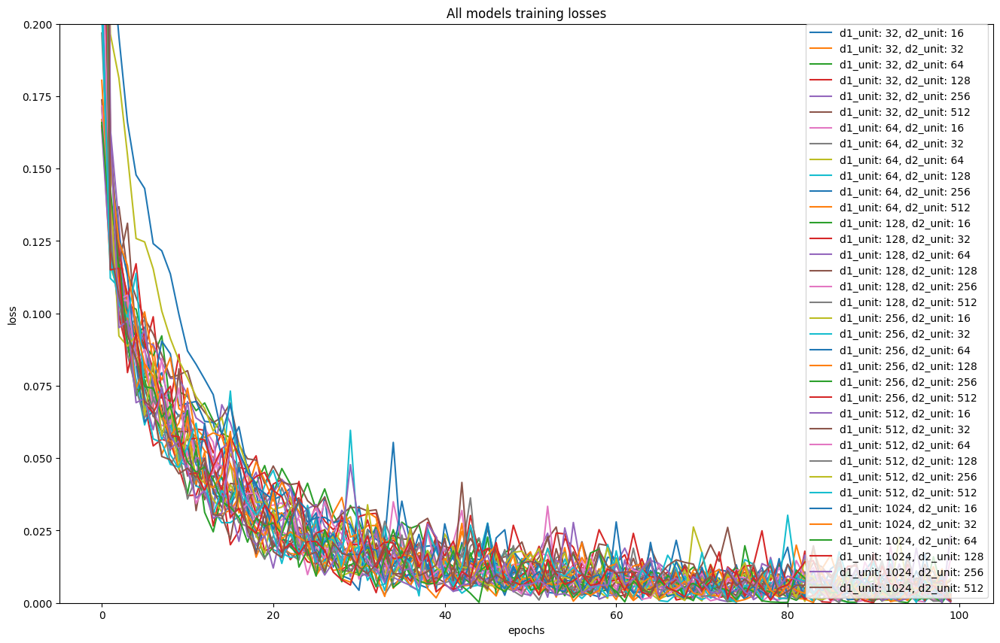

In [ ]:
i = 0
plt.figure(figsize=(16, 10))
for d1_units in dense1:
    for d2_units in dense2:
        plt.plot(all_dense_history[i].history['loss'], label=f'd1_unit: {d1_units}, d2_unit: {d2_units}')
        i = i + 1

plt.title('All models training losses')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.ylim([0, 0.2])
plt.show()

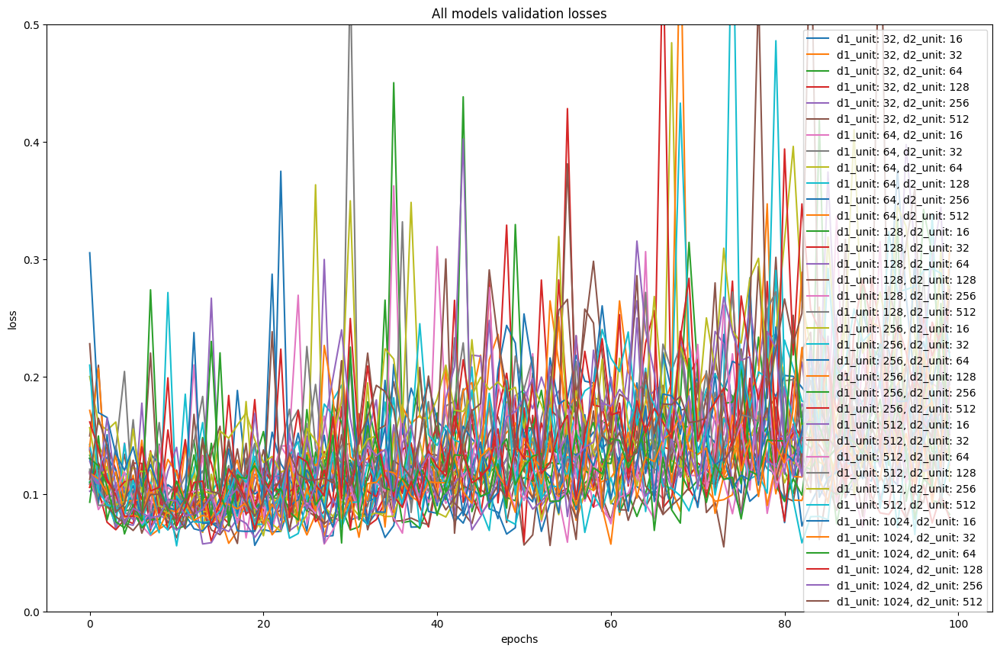

In [ ]:
i = 0
plt.figure(figsize=(16, 10))
for d1_units in dense1:
    for d2_units in dense2:
        plt.plot(all_dense_history[i].history['val_loss'], label=f'd1_unit: {d1_units}, d2_unit: {d2_units}')
        i = i + 1


plt.title('All models validation losses')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.ylim([0, 0.5])
plt.show()

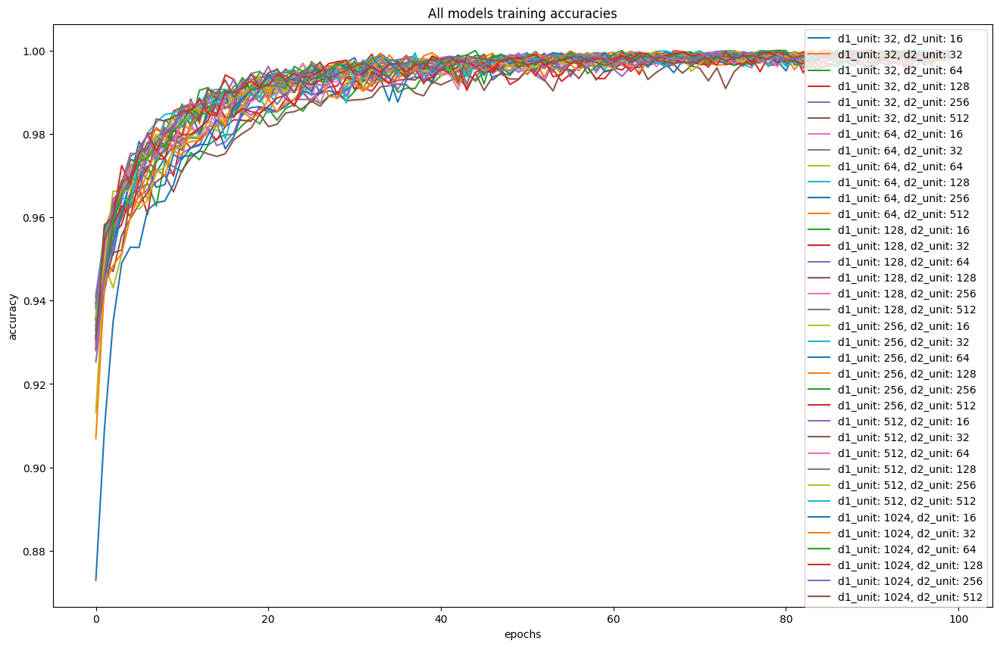

In [ ]:
i = 0
plt.figure(figsize=(16, 10))
for d1_units in dense1:
    for d2_units in dense2:
        plt.plot(all_dense_history[i].history['accuracy'], label=f'd1_unit: {d1_units}, d2_unit: {d2_units}')
        i = i + 1


plt.title('All models training accuracies')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

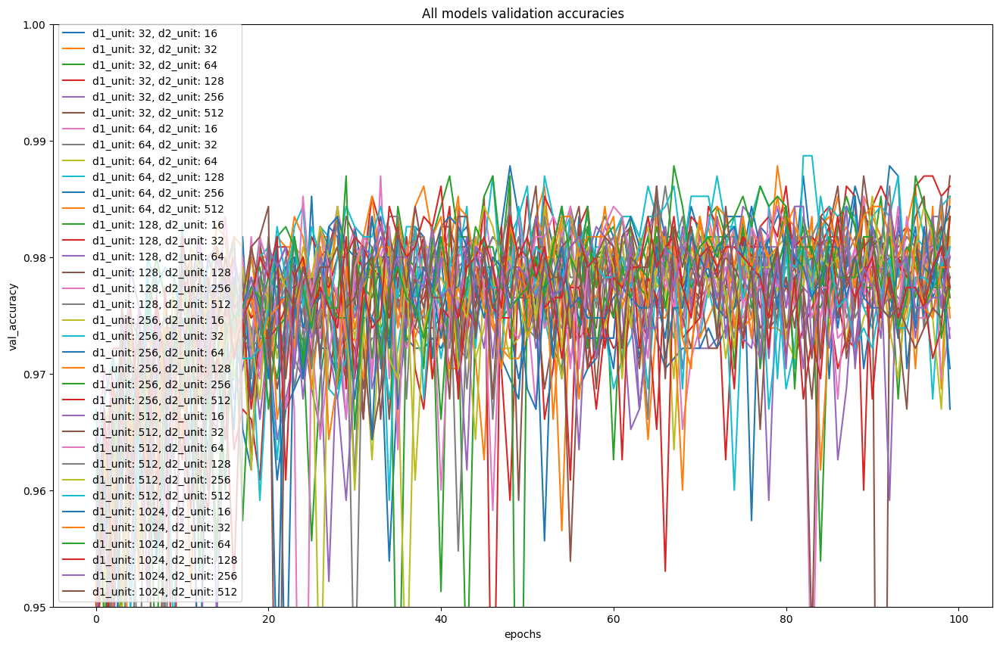

In [ ]:
i = 0
plt.figure(figsize=(16, 10))
for d1_units in dense1:
    for d2_units in dense2:
        plt.plot(all_dense_history[i].history['val_accuracy'], label=f'd1_unit: {d1_units}, d2_unit: {d2_units}')
        i = i + 1


plt.title('All models validation accuracies')
plt.xlabel('epochs')
plt.ylabel('val_accuracy')
plt.legend()
plt.ylim([.95, 1])
plt.show()

## Let's experiment with the kernel size

```
kernel_sizes = [3, 4, 5, 6]

```


In [ ]:
class eegClassifier(keras.Model):
    def __init__(self, input_shape, ks_1, ks_2):
        super(eegClassifier, self).__init__()

        self.conv1 = layers.Conv1D(filters=128, kernel_size=ks_1, input_shape=input_shape)
        self.bn_1 = BatchNormalization()
        self.max_pool_1 = layers.MaxPooling1D(2, padding='same')

        self.conv2 = layers.Conv1D(filters=512, kernel_size=ks_2)
        self.bn_2 = BatchNormalization()
        self.max_pool_2 = layers.MaxPooling1D(2, padding='same')

        self.flatten = Flatten()

        self.dense_1 = Dense(128)
        self.dense_2 = Dense(32)

        self.output_dense = Dense(2, activation='softmax')

    def call(self, inputs):
        x = self.conv1(inputs)
        x = tf.nn.relu(self.bn_1(x))
        x = self.max_pool_1(x)

        x = self.conv2(x)
        x = tf.nn.relu(self.bn_2(x))
        x = self.max_pool_2(x)

        x = self.flatten(x)
        x = self.dense_1(x)
        x = tf.nn.relu(x)
        x = self.dense_2(x)
        x = tf.nn.relu(x)
        return self.output_dense(x)






---- conv1_ks = 3 ---- conv2_ks = 3-------
Epoch 1/100
288/288 [==============================] - 6s 8ms/step - loss: 0.2346 - accuracy: 0.9372 - val_loss: 0.1601 - val_accuracy: 0.9452
Epoch 2/100
288/288 [==============================] - 2s 7ms/step - loss: 0.1253 - accuracy: 0.9542 - val_loss: 0.0967 - val_accuracy: 0.9661
Epoch 3/100
288/288 [==============================] - 2s 7ms/step - loss: 0.1072 - accuracy: 0.9599 - val_loss: 0.2018 - val_accuracy: 0.9278
Epoch 4/100
288/288 [==============================] - 2s 7ms/step - loss: 0.0919 - accuracy: 0.9655 - val_loss: 0.0957 - val_accuracy: 0.9626
Epoch 5/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0826 - accuracy: 0.9677 - val_loss: 0.0882 - val_accuracy: 0.9635
Epoch 6/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0912 - accuracy: 0.9680 - val_loss: 0.0670 - val_accuracy: 0.9809
Epoch 7/100
288/288 [==============================] - 2s 7ms/step - loss: 0.0665 - accuracy: 0

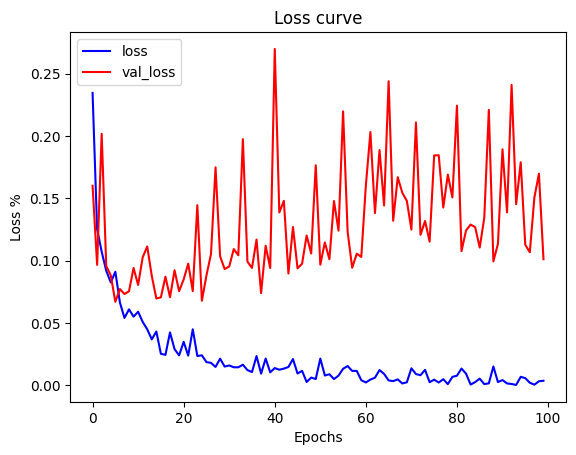

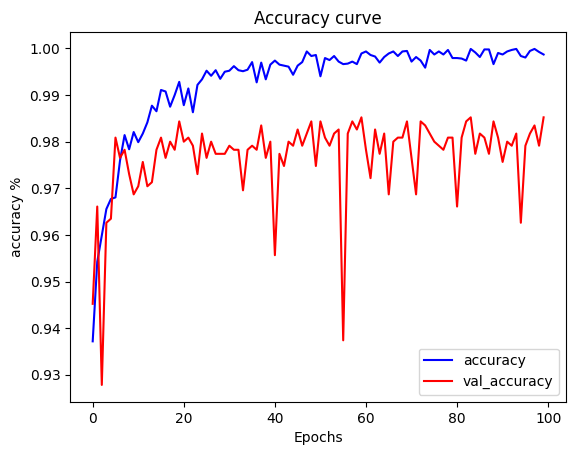





---- conv1_ks = 3 ---- conv2_ks = 4-------
Epoch 1/100
288/288 [==============================] - 5s 9ms/step - loss: 0.3627 - accuracy: 0.9280 - val_loss: 0.1208 - val_accuracy: 0.9574
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1309 - accuracy: 0.9521 - val_loss: 0.1380 - val_accuracy: 0.9478
Epoch 3/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1064 - accuracy: 0.9597 - val_loss: 0.0974 - val_accuracy: 0.9609
Epoch 4/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0943 - accuracy: 0.9668 - val_loss: 0.0946 - val_accuracy: 0.9626
Epoch 5/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0770 - accuracy: 0.9727 - val_loss: 0.0941 - val_accuracy: 0.9635
Epoch 6/100
288/288 [==============================] - 3s 10ms/step - loss: 0.0805 - accuracy: 0.9717 - val_loss: 0.0946 - val_accuracy: 0.9600
Epoch 7/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0735 - accuracy: 

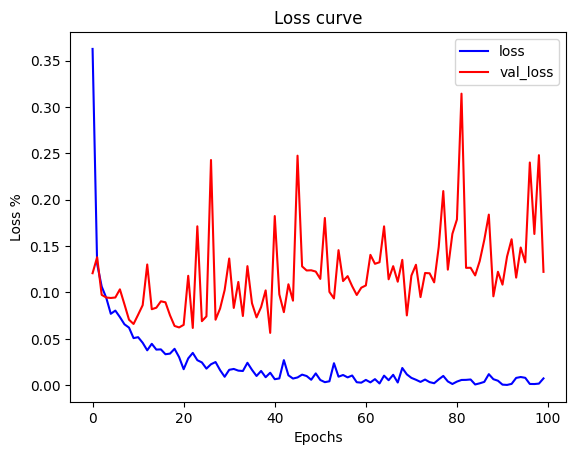

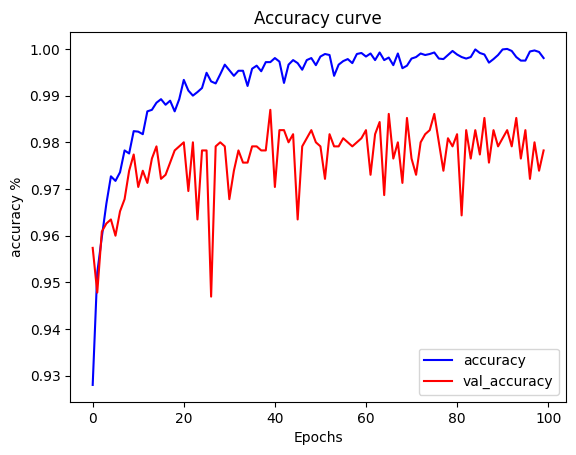





---- conv1_ks = 3 ---- conv2_ks = 5-------
Epoch 1/100
288/288 [==============================] - 6s 9ms/step - loss: 0.2269 - accuracy: 0.9390 - val_loss: 0.1213 - val_accuracy: 0.9600
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1294 - accuracy: 0.9529 - val_loss: 0.0890 - val_accuracy: 0.9687
Epoch 3/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0937 - accuracy: 0.9653 - val_loss: 0.0851 - val_accuracy: 0.9670
Epoch 4/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0815 - accuracy: 0.9692 - val_loss: 0.1010 - val_accuracy: 0.9591
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0735 - accuracy: 0.9732 - val_loss: 0.0964 - val_accuracy: 0.9704
Epoch 6/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0706 - accuracy: 0.9742 - val_loss: 0.0788 - val_accuracy: 0.9783
Epoch 7/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0620 - accuracy: 0

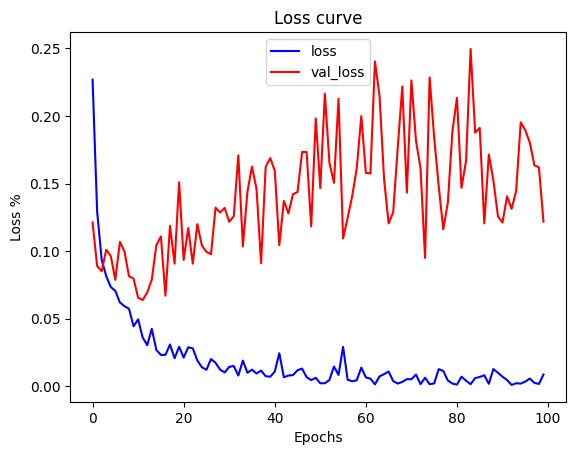

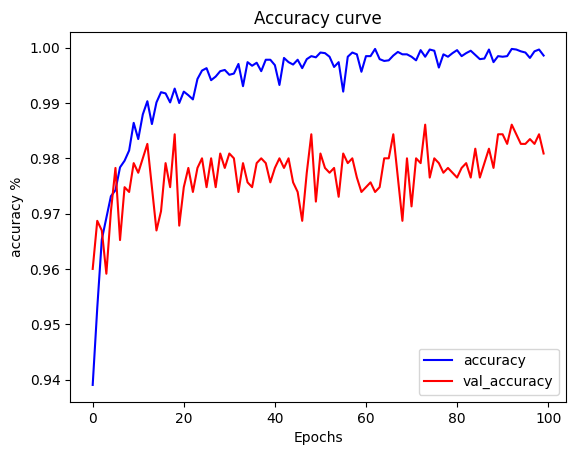





---- conv1_ks = 3 ---- conv2_ks = 6-------
Epoch 1/100
288/288 [==============================] - 9s 11ms/step - loss: 0.2210 - accuracy: 0.9405 - val_loss: 0.1601 - val_accuracy: 0.9461
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1244 - accuracy: 0.9547 - val_loss: 0.1124 - val_accuracy: 0.9513
Epoch 3/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0963 - accuracy: 0.9648 - val_loss: 0.0802 - val_accuracy: 0.9661
Epoch 4/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0718 - accuracy: 0.9729 - val_loss: 0.0744 - val_accuracy: 0.9757
Epoch 5/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0746 - accuracy: 0.9717 - val_loss: 0.0967 - val_accuracy: 0.9661
Epoch 6/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0642 - accuracy: 0.9774 - val_loss: 0.0869 - val_accuracy: 0.9722
Epoch 7/100
288/288 [==============================] - 3s 10ms/step - loss: 0.0569 - accuracy:

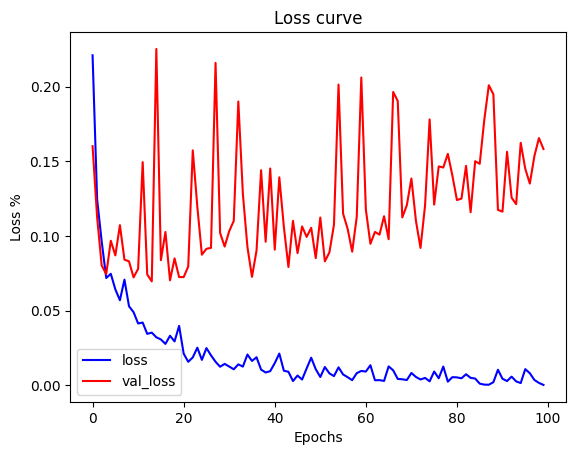

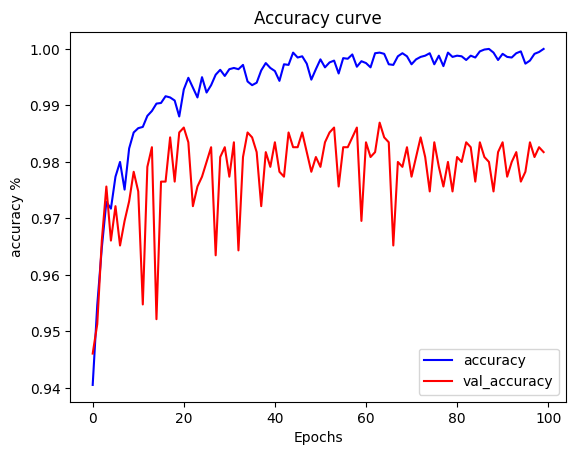





---- conv1_ks = 4 ---- conv2_ks = 3-------
Epoch 1/100
288/288 [==============================] - 5s 9ms/step - loss: 0.3816 - accuracy: 0.9280 - val_loss: 0.1161 - val_accuracy: 0.9600
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1387 - accuracy: 0.9480 - val_loss: 0.1298 - val_accuracy: 0.9522
Epoch 3/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1210 - accuracy: 0.9571 - val_loss: 0.1460 - val_accuracy: 0.9487
Epoch 4/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1099 - accuracy: 0.9603 - val_loss: 0.0788 - val_accuracy: 0.9739
Epoch 5/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0811 - accuracy: 0.9722 - val_loss: 0.0700 - val_accuracy: 0.9730
Epoch 6/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0813 - accuracy: 0.9717 - val_loss: 0.0728 - val_accuracy: 0.9678
Epoch 7/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0631 - accuracy: 0

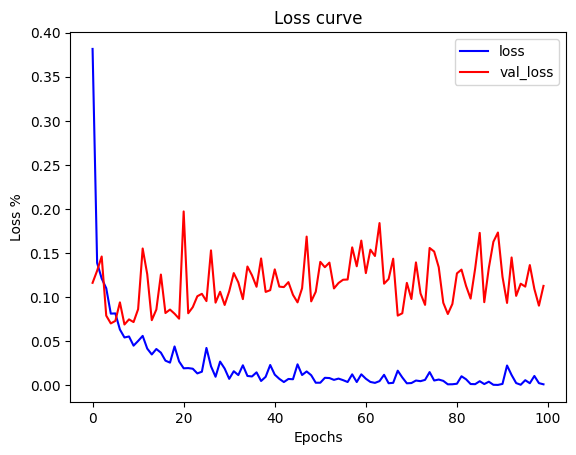

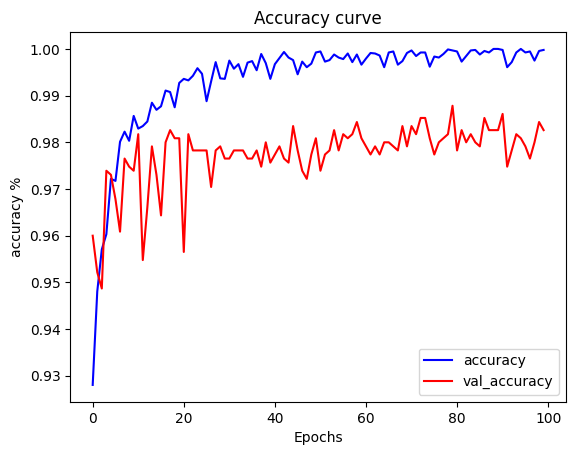





---- conv1_ks = 4 ---- conv2_ks = 4-------
Epoch 1/100
288/288 [==============================] - 7s 13ms/step - loss: 0.3299 - accuracy: 0.9303 - val_loss: 0.1141 - val_accuracy: 0.9617
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1166 - accuracy: 0.9546 - val_loss: 0.1280 - val_accuracy: 0.9530
Epoch 3/100
288/288 [==============================] - 3s 10ms/step - loss: 0.0999 - accuracy: 0.9646 - val_loss: 0.1069 - val_accuracy: 0.9609
Epoch 4/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0973 - accuracy: 0.9662 - val_loss: 0.0838 - val_accuracy: 0.9713
Epoch 5/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0808 - accuracy: 0.9705 - val_loss: 0.1297 - val_accuracy: 0.9470
Epoch 6/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0821 - accuracy: 0.9691 - val_loss: 0.0837 - val_accuracy: 0.9652
Epoch 7/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0627 - accuracy:

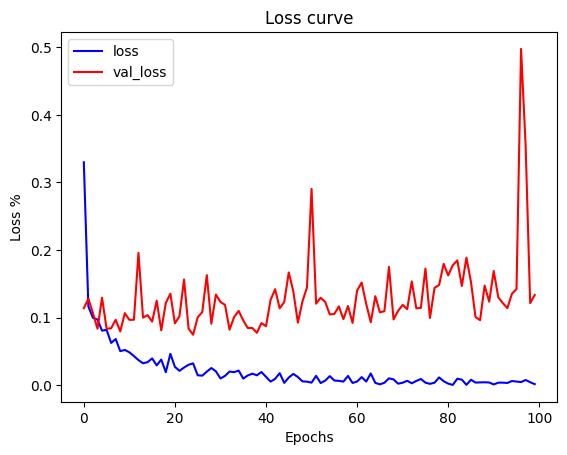

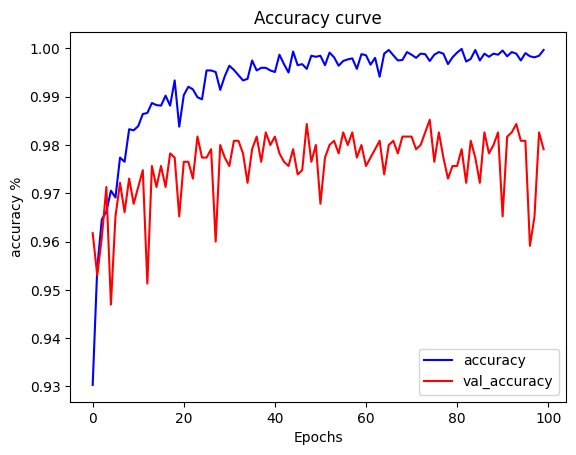





---- conv1_ks = 4 ---- conv2_ks = 5-------
Epoch 1/100
288/288 [==============================] - 6s 10ms/step - loss: 0.3087 - accuracy: 0.9339 - val_loss: 0.1219 - val_accuracy: 0.9557
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1220 - accuracy: 0.9555 - val_loss: 0.0998 - val_accuracy: 0.9591
Epoch 3/100
288/288 [==============================] - 2s 9ms/step - loss: 0.1032 - accuracy: 0.9616 - val_loss: 0.0887 - val_accuracy: 0.9687
Epoch 4/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0850 - accuracy: 0.9689 - val_loss: 0.0985 - val_accuracy: 0.9609
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0731 - accuracy: 0.9740 - val_loss: 0.1078 - val_accuracy: 0.9600
Epoch 6/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0651 - accuracy: 0.9793 - val_loss: 0.0886 - val_accuracy: 0.9704
Epoch 7/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0631 - accuracy: 

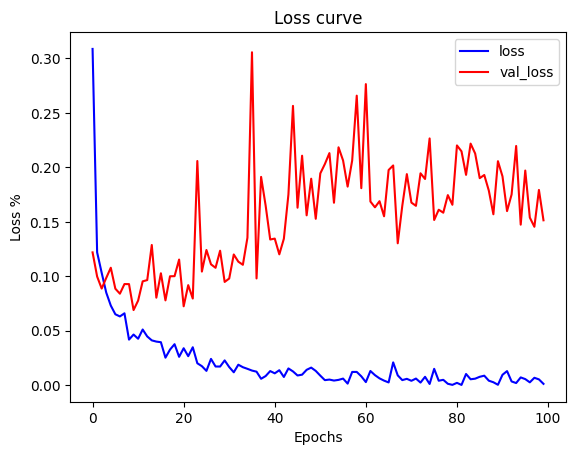

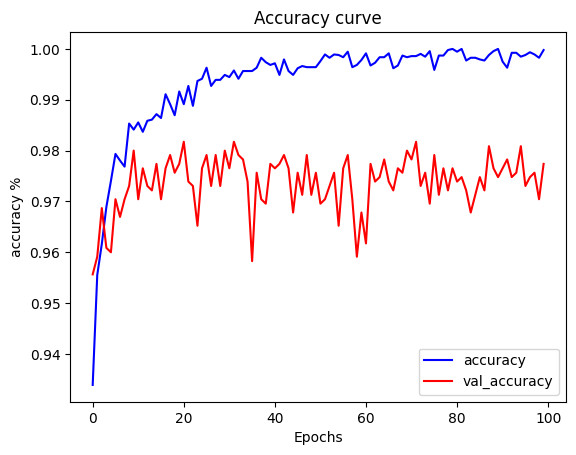





---- conv1_ks = 4 ---- conv2_ks = 6-------
Epoch 1/100
288/288 [==============================] - 6s 11ms/step - loss: 0.2267 - accuracy: 0.9317 - val_loss: 0.1129 - val_accuracy: 0.9530
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1101 - accuracy: 0.9545 - val_loss: 0.0871 - val_accuracy: 0.9652
Epoch 3/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0935 - accuracy: 0.9649 - val_loss: 0.0767 - val_accuracy: 0.9687
Epoch 4/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0880 - accuracy: 0.9667 - val_loss: 0.1015 - val_accuracy: 0.9661
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0785 - accuracy: 0.9698 - val_loss: 0.0790 - val_accuracy: 0.9626
Epoch 6/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0629 - accuracy: 0.9768 - val_loss: 0.0920 - val_accuracy: 0.9652
Epoch 7/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0665 - accuracy: 

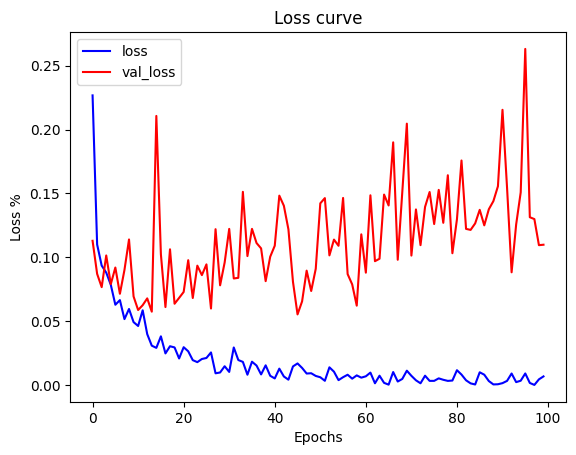

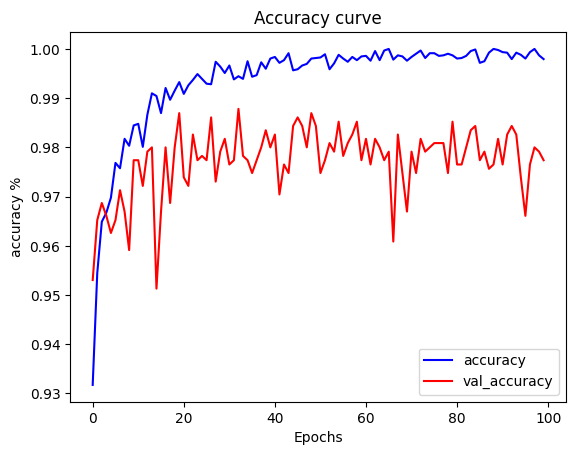





---- conv1_ks = 5 ---- conv2_ks = 3-------
Epoch 1/100
288/288 [==============================] - 5s 9ms/step - loss: 0.2321 - accuracy: 0.9364 - val_loss: 0.1334 - val_accuracy: 0.9426
Epoch 2/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1420 - accuracy: 0.9492 - val_loss: 0.1446 - val_accuracy: 0.9330
Epoch 3/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1078 - accuracy: 0.9611 - val_loss: 0.0802 - val_accuracy: 0.9722
Epoch 4/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0991 - accuracy: 0.9630 - val_loss: 0.0945 - val_accuracy: 0.9652
Epoch 5/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0835 - accuracy: 0.9711 - val_loss: 0.0635 - val_accuracy: 0.9783
Epoch 6/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0674 - accuracy: 0.9776 - val_loss: 0.0568 - val_accuracy: 0.9783
Epoch 7/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0620 - accuracy: 0

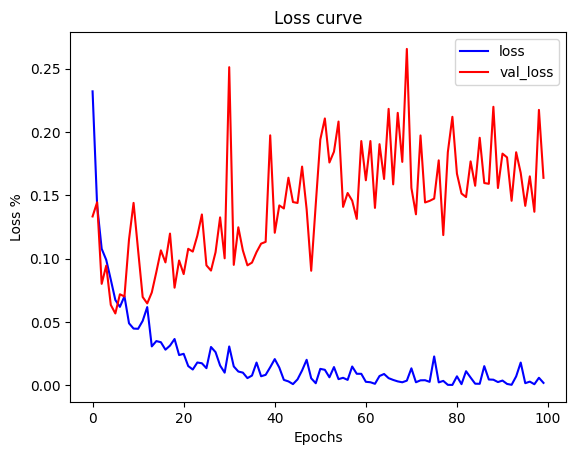

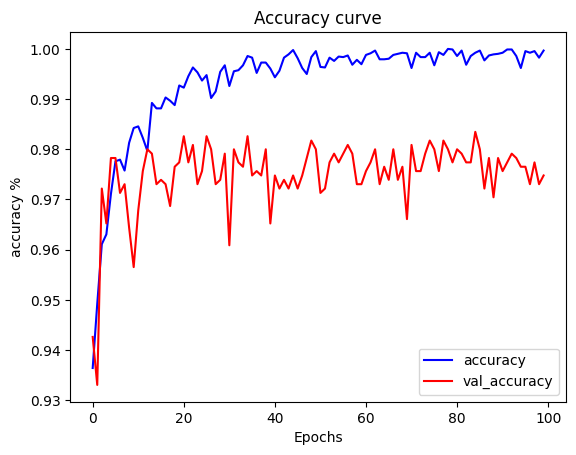





---- conv1_ks = 5 ---- conv2_ks = 4-------
Epoch 1/100
288/288 [==============================] - 5s 10ms/step - loss: 0.3194 - accuracy: 0.9368 - val_loss: 0.1264 - val_accuracy: 0.9574
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1449 - accuracy: 0.9533 - val_loss: 0.2148 - val_accuracy: 0.9035
Epoch 3/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1188 - accuracy: 0.9582 - val_loss: 0.1648 - val_accuracy: 0.9391
Epoch 4/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0846 - accuracy: 0.9707 - val_loss: 0.0853 - val_accuracy: 0.9757
Epoch 5/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0729 - accuracy: 0.9746 - val_loss: 0.0760 - val_accuracy: 0.9713
Epoch 6/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0797 - accuracy: 0.9737 - val_loss: 0.0677 - val_accuracy: 0.9748
Epoch 7/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0658 - accuracy: 

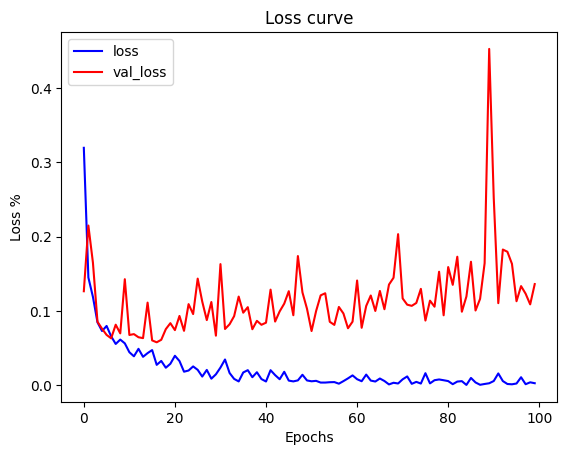

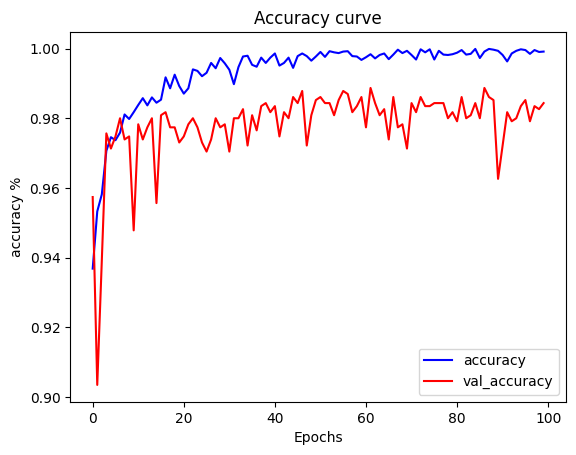





---- conv1_ks = 5 ---- conv2_ks = 5-------
Epoch 1/100
288/288 [==============================] - 6s 10ms/step - loss: 0.3079 - accuracy: 0.9350 - val_loss: 0.1222 - val_accuracy: 0.9661
Epoch 2/100
288/288 [==============================] - 2s 9ms/step - loss: 0.1268 - accuracy: 0.9565 - val_loss: 0.1204 - val_accuracy: 0.9496
Epoch 3/100
288/288 [==============================] - 2s 9ms/step - loss: 0.1158 - accuracy: 0.9591 - val_loss: 0.0988 - val_accuracy: 0.9678
Epoch 4/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0869 - accuracy: 0.9698 - val_loss: 0.0811 - val_accuracy: 0.9730
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0901 - accuracy: 0.9688 - val_loss: 0.0832 - val_accuracy: 0.9757
Epoch 6/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0877 - accuracy: 0.9687 - val_loss: 0.0674 - val_accuracy: 0.9713
Epoch 7/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0721 - accuracy: 

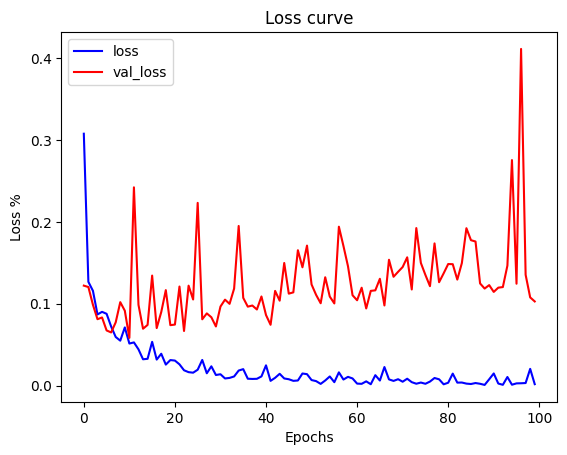

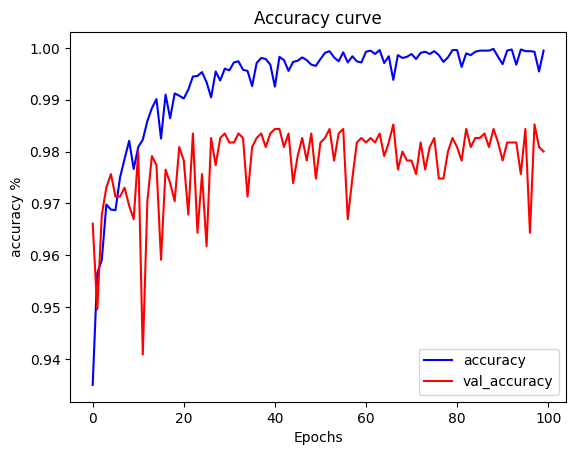





---- conv1_ks = 5 ---- conv2_ks = 6-------
Epoch 1/100
288/288 [==============================] - 6s 10ms/step - loss: 0.3681 - accuracy: 0.9341 - val_loss: 0.1357 - val_accuracy: 0.9609
Epoch 2/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1229 - accuracy: 0.9533 - val_loss: 0.0986 - val_accuracy: 0.9600
Epoch 3/100
288/288 [==============================] - 3s 10ms/step - loss: 0.0933 - accuracy: 0.9658 - val_loss: 0.1446 - val_accuracy: 0.9409
Epoch 4/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0792 - accuracy: 0.9716 - val_loss: 0.0881 - val_accuracy: 0.9635
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0841 - accuracy: 0.9688 - val_loss: 0.0911 - val_accuracy: 0.9748
Epoch 6/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0641 - accuracy: 0.9782 - val_loss: 0.0757 - val_accuracy: 0.9722
Epoch 7/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0605 - accuracy:

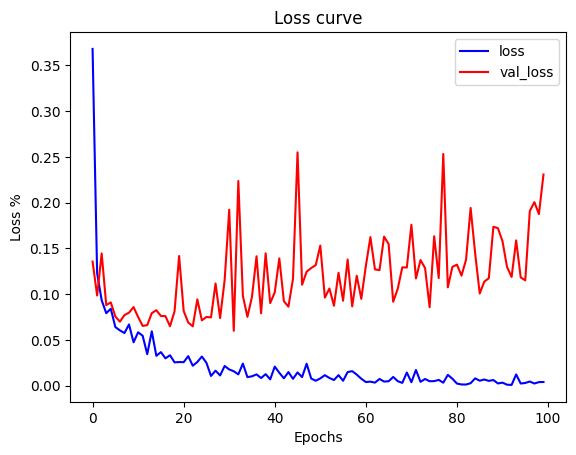

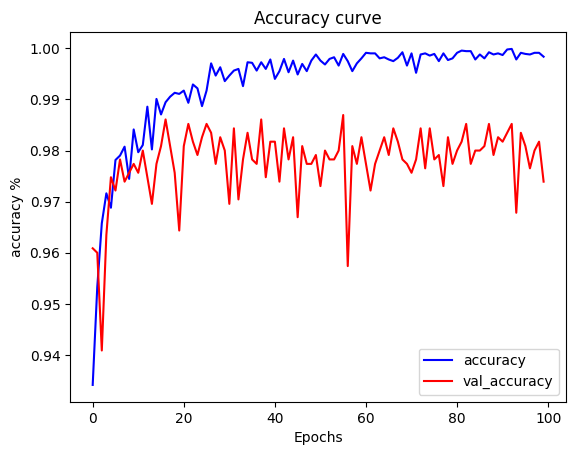





---- conv1_ks = 6 ---- conv2_ks = 3-------
Epoch 1/100
288/288 [==============================] - 6s 10ms/step - loss: 0.2261 - accuracy: 0.9345 - val_loss: 0.1206 - val_accuracy: 0.9565
Epoch 2/100
288/288 [==============================] - 2s 9ms/step - loss: 0.1159 - accuracy: 0.9525 - val_loss: 0.1673 - val_accuracy: 0.9322
Epoch 3/100
288/288 [==============================] - 2s 8ms/step - loss: 0.1054 - accuracy: 0.9609 - val_loss: 0.0899 - val_accuracy: 0.9617
Epoch 4/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0934 - accuracy: 0.9660 - val_loss: 0.0824 - val_accuracy: 0.9609
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0706 - accuracy: 0.9723 - val_loss: 0.0960 - val_accuracy: 0.9643
Epoch 6/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0852 - accuracy: 0.9695 - val_loss: 0.0899 - val_accuracy: 0.9678
Epoch 7/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0708 - accuracy: 

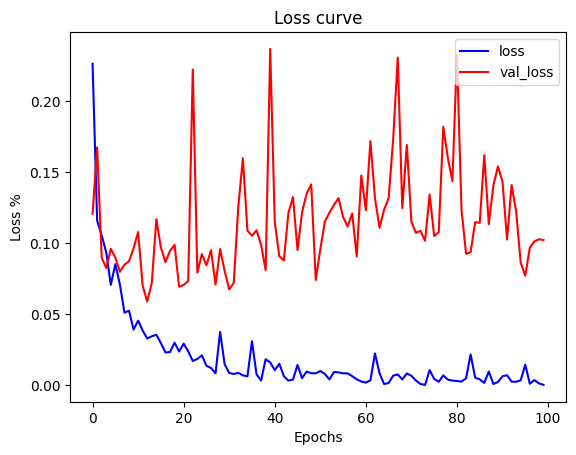

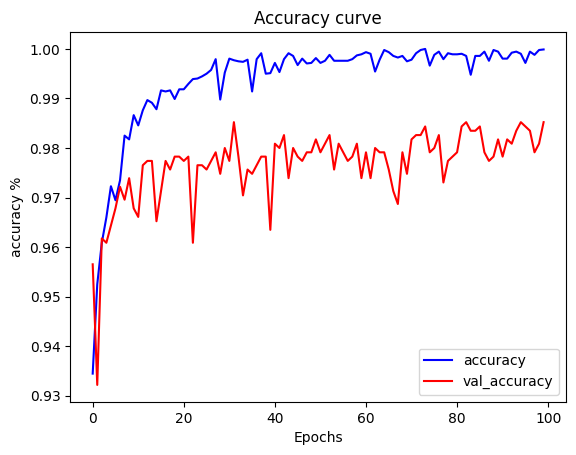





---- conv1_ks = 6 ---- conv2_ks = 4-------
Epoch 1/100
288/288 [==============================] - 6s 11ms/step - loss: 0.4500 - accuracy: 0.9371 - val_loss: 0.1168 - val_accuracy: 0.9496
Epoch 2/100
288/288 [==============================] - 3s 11ms/step - loss: 0.1313 - accuracy: 0.9545 - val_loss: 0.1402 - val_accuracy: 0.9565
Epoch 3/100
288/288 [==============================] - 2s 9ms/step - loss: 0.1048 - accuracy: 0.9641 - val_loss: 0.0755 - val_accuracy: 0.9713
Epoch 4/100
288/288 [==============================] - 3s 10ms/step - loss: 0.0785 - accuracy: 0.9732 - val_loss: 0.0724 - val_accuracy: 0.9713
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0630 - accuracy: 0.9778 - val_loss: 0.0876 - val_accuracy: 0.9670
Epoch 6/100
288/288 [==============================] - 4s 13ms/step - loss: 0.0626 - accuracy: 0.9786 - val_loss: 0.0652 - val_accuracy: 0.9730
Epoch 7/100
288/288 [==============================] - 4s 14ms/step - loss: 0.0759 - accura

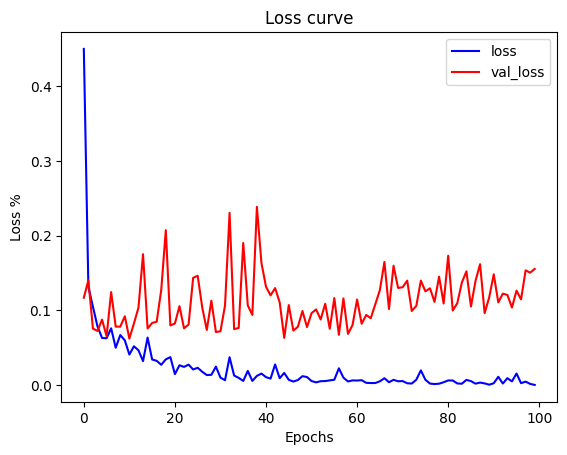

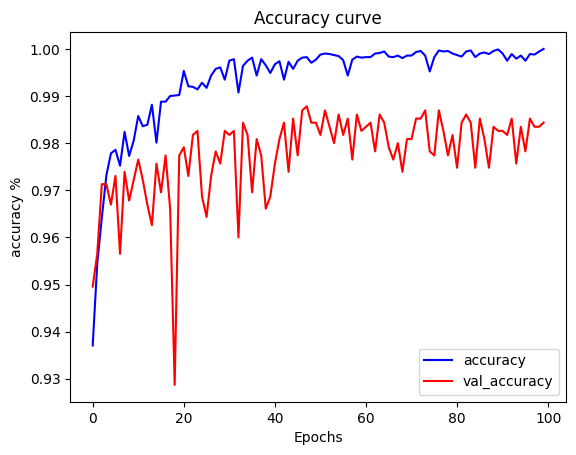





---- conv1_ks = 6 ---- conv2_ks = 5-------
Epoch 1/100
288/288 [==============================] - 5s 10ms/step - loss: 0.1830 - accuracy: 0.9428 - val_loss: 0.1112 - val_accuracy: 0.9591
Epoch 2/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1127 - accuracy: 0.9575 - val_loss: 0.1082 - val_accuracy: 0.9643
Epoch 3/100
288/288 [==============================] - 3s 10ms/step - loss: 0.0981 - accuracy: 0.9630 - val_loss: 0.1034 - val_accuracy: 0.9583
Epoch 4/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0934 - accuracy: 0.9679 - val_loss: 0.1260 - val_accuracy: 0.9557
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0886 - accuracy: 0.9682 - val_loss: 0.0818 - val_accuracy: 0.9687
Epoch 6/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0733 - accuracy: 0.9725 - val_loss: 0.1046 - val_accuracy: 0.9565
Epoch 7/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0693 - accuracy:

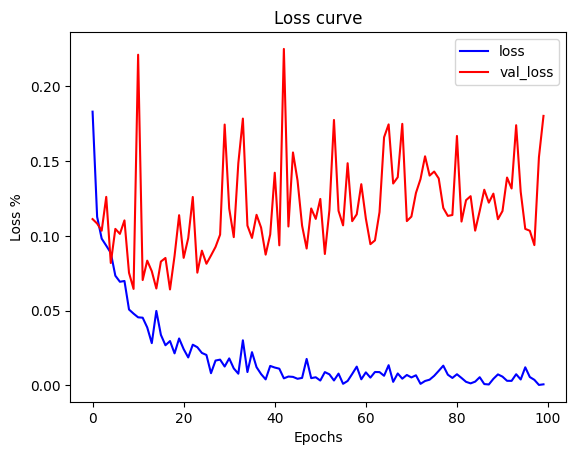

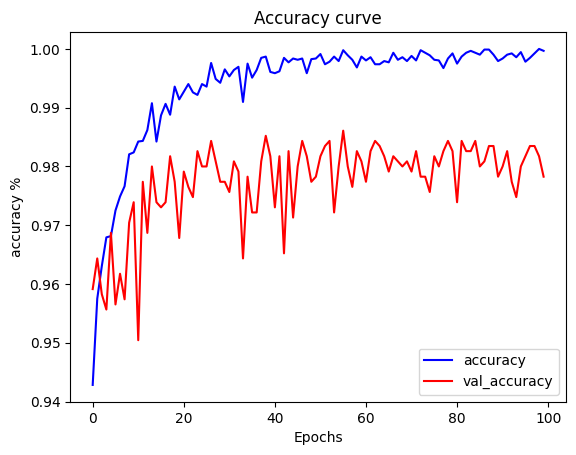





---- conv1_ks = 6 ---- conv2_ks = 6-------
Epoch 1/100
288/288 [==============================] - 6s 10ms/step - loss: 0.3568 - accuracy: 0.9329 - val_loss: 0.1362 - val_accuracy: 0.9678
Epoch 2/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1065 - accuracy: 0.9639 - val_loss: 0.1581 - val_accuracy: 0.9426
Epoch 3/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1054 - accuracy: 0.9626 - val_loss: 0.0870 - val_accuracy: 0.9722
Epoch 4/100
288/288 [==============================] - 3s 10ms/step - loss: 0.0731 - accuracy: 0.9758 - val_loss: 0.0949 - val_accuracy: 0.9687
Epoch 5/100
288/288 [==============================] - 3s 10ms/step - loss: 0.0673 - accuracy: 0.9770 - val_loss: 0.0779 - val_accuracy: 0.9713
Epoch 6/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0802 - accuracy: 0.9720 - val_loss: 0.0837 - val_accuracy: 0.9722
Epoch 7/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0515 - accuracy

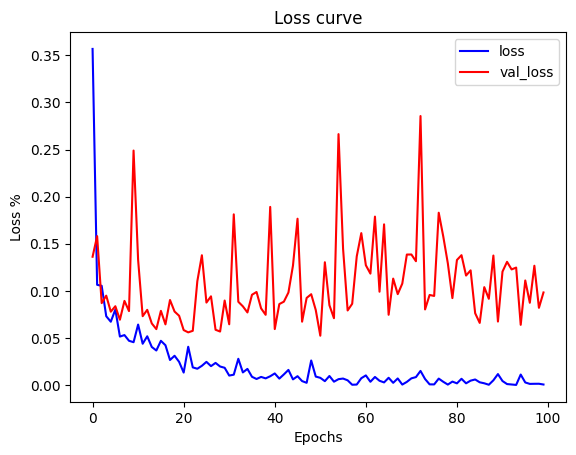

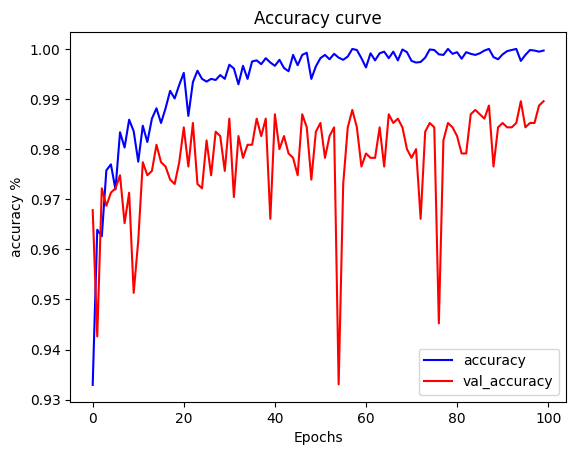

In [ ]:
kernel_sizes = [3, 4, 5, 6]

all_ks_history = []
all_ks_models = []

for ks_1 in kernel_sizes:
    for ks_2 in kernel_sizes:
        model = eegClassifier(input_shape, ks_1, ks_2)
        model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
        print('\n\n\n')
        print(f'---- conv1_ks = {ks_1} ---- conv2_ks = {ks_2}-------')
        history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)
        all_ks_models.append(model)
        print('\n\n')
        print(model.summary())
        print('\n')
        plot_loss(history)
        plot_accuracy(history)

        all_ks_history.append(history)


## Let's experiment with the number of conv layers

```
layers = [1, 2, 3, 4, 5]


```


In [ ]:
class eegClassifier(keras.Model):
    def __init__(self, input_shape, conv_layers):
        super(eegClassifier, self).__init__()

        self.conv_layers = []
        for i in range(conv_layers):
            filters = 128 * 2**i
            kernel_size = 6 if i == 0 else 3
            padding = 'same' if i == 0 else 'valid'
            conv_layer = layers.Conv1D(filters=filters, kernel_size=kernel_size, padding=padding, activation='relu')
            self.conv_layers.append(conv_layer)
            bn_layer = BatchNormalization()
            self.__setattr__(f'bn_{i}', bn_layer)
            max_pool_layer = layers.MaxPooling1D(2, padding='same')
            self.__setattr__(f'max_pool_{i}', max_pool_layer)

        self.flatten = Flatten()

        self.dense_1 = Dense(128)
        self.dense_2 = Dense(32)

        self.output_dense = Dense(2, activation='softmax')

    def call(self, inputs):
        x = inputs
        for i in range(len(self.conv_layers)):
            x = self.conv_layers[i](x)
            x = self.__getattribute__(f'bn_{i}')(x)
            x = self.__getattribute__(f'max_pool_{i}')(x)

        x = self.flatten(x)
        x = self.dense_1(x)
        x = tf.nn.relu(x)
        x = self.dense_2(x)
        x = tf.nn.relu(x)
        return self.output_dense(x)






---- conv layers = 1-------
Epoch 1/100
288/288 [==============================] - 4s 6ms/step - loss: 0.3089 - accuracy: 0.9427 - val_loss: 0.1759 - val_accuracy: 0.9539
Epoch 2/100
288/288 [==============================] - 1s 4ms/step - loss: 0.1259 - accuracy: 0.9626 - val_loss: 0.1378 - val_accuracy: 0.9600
Epoch 3/100
288/288 [==============================] - 1s 5ms/step - loss: 0.1046 - accuracy: 0.9677 - val_loss: 0.1341 - val_accuracy: 0.9661
Epoch 4/100
288/288 [==============================] - 2s 5ms/step - loss: 0.0809 - accuracy: 0.9747 - val_loss: 0.1076 - val_accuracy: 0.9670
Epoch 5/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0586 - accuracy: 0.9785 - val_loss: 0.0991 - val_accuracy: 0.9661
Epoch 6/100
288/288 [==============================] - 1s 4ms/step - loss: 0.0531 - accuracy: 0.9825 - val_loss: 0.0975 - val_accuracy: 0.9696
Epoch 7/100
288/288 [==============================] - 1s 4ms/step - loss: 0.0405 - accuracy: 0.9852 - val_los

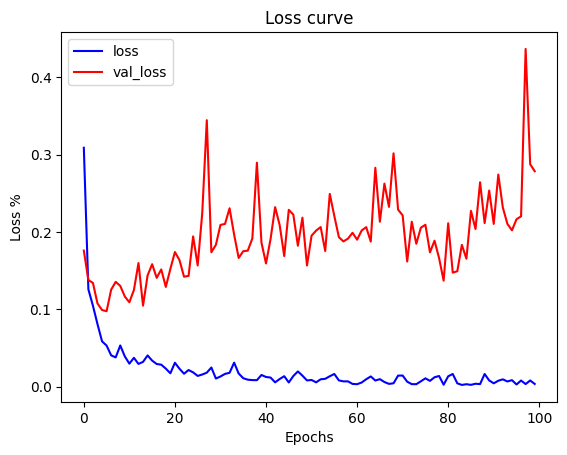

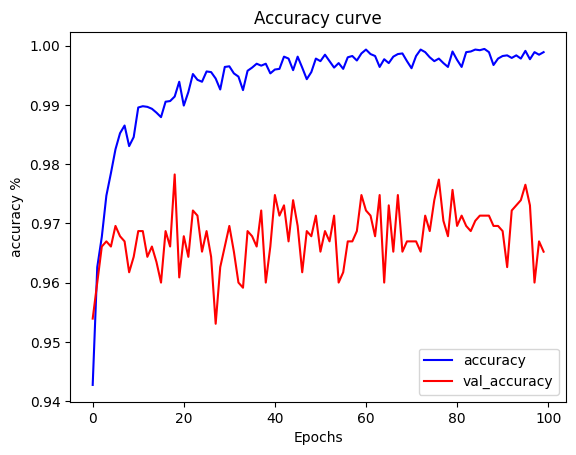





---- conv layers = 2-------
Epoch 1/100
288/288 [==============================] - 6s 9ms/step - loss: 0.1933 - accuracy: 0.9462 - val_loss: 0.1090 - val_accuracy: 0.9557
Epoch 2/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0948 - accuracy: 0.9658 - val_loss: 0.0884 - val_accuracy: 0.9739
Epoch 3/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0611 - accuracy: 0.9786 - val_loss: 0.0768 - val_accuracy: 0.9739
Epoch 4/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0520 - accuracy: 0.9818 - val_loss: 0.0814 - val_accuracy: 0.9757
Epoch 5/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0621 - accuracy: 0.9800 - val_loss: 0.1050 - val_accuracy: 0.9687
Epoch 6/100
288/288 [==============================] - 2s 6ms/step - loss: 0.0365 - accuracy: 0.9870 - val_loss: 0.0944 - val_accuracy: 0.9774
Epoch 7/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0232 - accuracy: 0.9928 - val_los

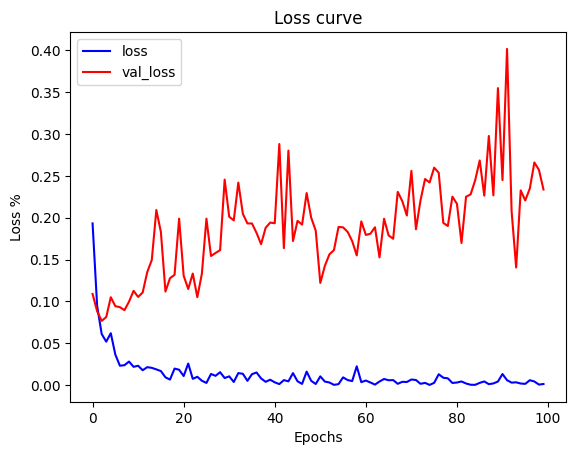

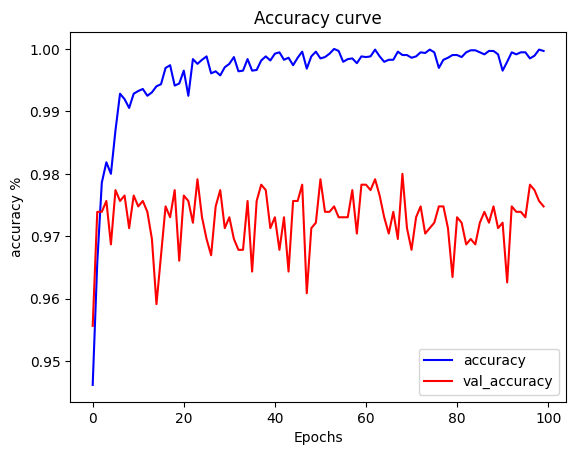





---- conv layers = 3-------
Epoch 1/100
288/288 [==============================] - 6s 10ms/step - loss: 0.1954 - accuracy: 0.9514 - val_loss: 0.1876 - val_accuracy: 0.9670
Epoch 2/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1208 - accuracy: 0.9673 - val_loss: 0.1109 - val_accuracy: 0.9704
Epoch 3/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0705 - accuracy: 0.9778 - val_loss: 0.0782 - val_accuracy: 0.9722
Epoch 4/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0559 - accuracy: 0.9786 - val_loss: 0.0952 - val_accuracy: 0.9757
Epoch 5/100
288/288 [==============================] - 2s 8ms/step - loss: 0.0334 - accuracy: 0.9883 - val_loss: 0.1374 - val_accuracy: 0.9583
Epoch 6/100
288/288 [==============================] - 2s 9ms/step - loss: 0.0353 - accuracy: 0.9879 - val_loss: 0.0777 - val_accuracy: 0.9774
Epoch 7/100
288/288 [==============================] - 3s 9ms/step - loss: 0.0319 - accuracy: 0.9889 - val_lo

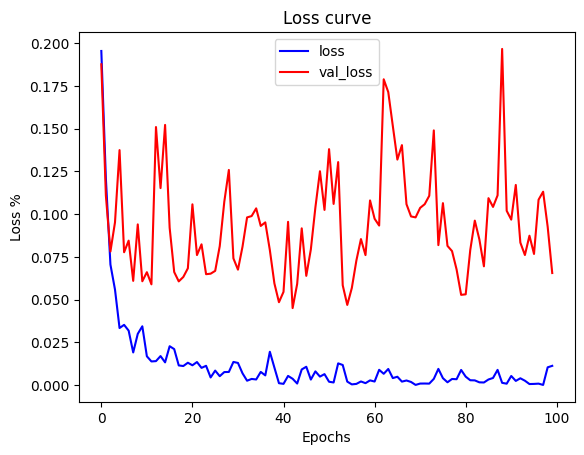

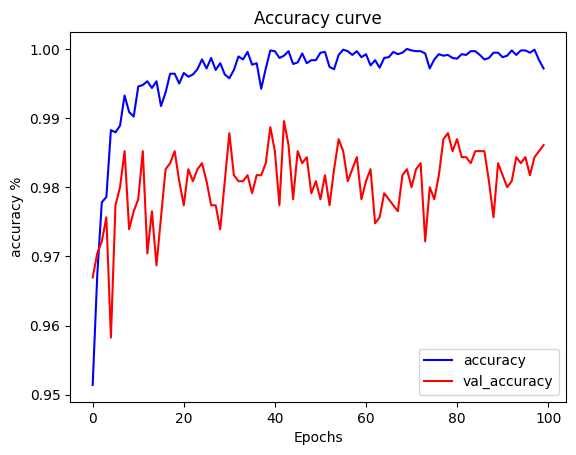





---- conv layers = 4-------
Epoch 1/100
288/288 [==============================] - 9s 13ms/step - loss: 0.1943 - accuracy: 0.9480 - val_loss: 0.1741 - val_accuracy: 0.9652
Epoch 2/100
288/288 [==============================] - 3s 12ms/step - loss: 0.1274 - accuracy: 0.9585 - val_loss: 0.1433 - val_accuracy: 0.9565
Epoch 3/100
288/288 [==============================] - 4s 13ms/step - loss: 0.0937 - accuracy: 0.9686 - val_loss: 0.0772 - val_accuracy: 0.9670
Epoch 4/100
288/288 [==============================] - 3s 12ms/step - loss: 0.0527 - accuracy: 0.9792 - val_loss: 0.0740 - val_accuracy: 0.9696
Epoch 5/100
288/288 [==============================] - 3s 12ms/step - loss: 0.0415 - accuracy: 0.9848 - val_loss: 0.0508 - val_accuracy: 0.9774
Epoch 6/100
288/288 [==============================] - 4s 12ms/step - loss: 0.0365 - accuracy: 0.9863 - val_loss: 0.0668 - val_accuracy: 0.9722
Epoch 7/100
288/288 [==============================] - 4s 13ms/step - loss: 0.0366 - accuracy: 0.9863 - 

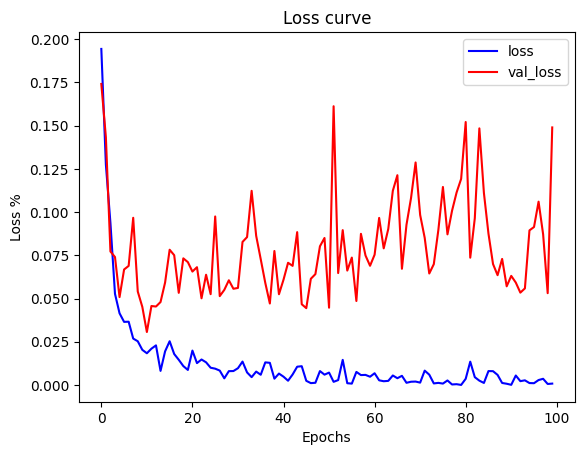

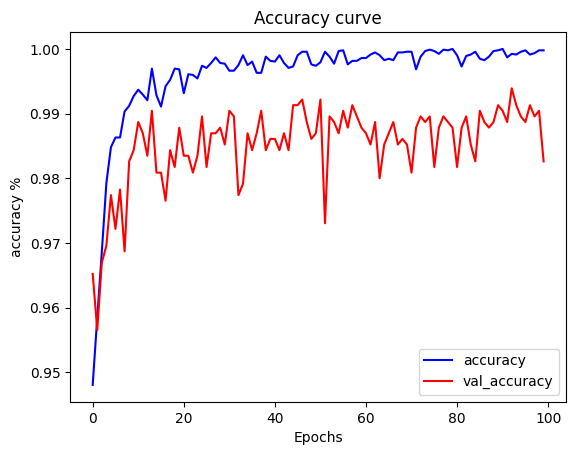





---- conv layers = 5-------
Epoch 1/100
288/288 [==============================] - 12s 21ms/step - loss: 0.2539 - accuracy: 0.9466 - val_loss: 0.1287 - val_accuracy: 0.9626
Epoch 2/100
288/288 [==============================] - 6s 19ms/step - loss: 0.1218 - accuracy: 0.9641 - val_loss: 0.1383 - val_accuracy: 0.9661
Epoch 3/100
288/288 [==============================] - 5s 19ms/step - loss: 0.0953 - accuracy: 0.9687 - val_loss: 0.0758 - val_accuracy: 0.9713
Epoch 4/100
288/288 [==============================] - 5s 19ms/step - loss: 0.0624 - accuracy: 0.9805 - val_loss: 0.0662 - val_accuracy: 0.9739
Epoch 5/100
288/288 [==============================] - 5s 19ms/step - loss: 0.0548 - accuracy: 0.9833 - val_loss: 0.0810 - val_accuracy: 0.9704
Epoch 6/100
288/288 [==============================] - 6s 19ms/step - loss: 0.0385 - accuracy: 0.9865 - val_loss: 0.0881 - val_accuracy: 0.9748
Epoch 7/100
288/288 [==============================] - 6s 19ms/step - loss: 0.0437 - accuracy: 0.9845 -

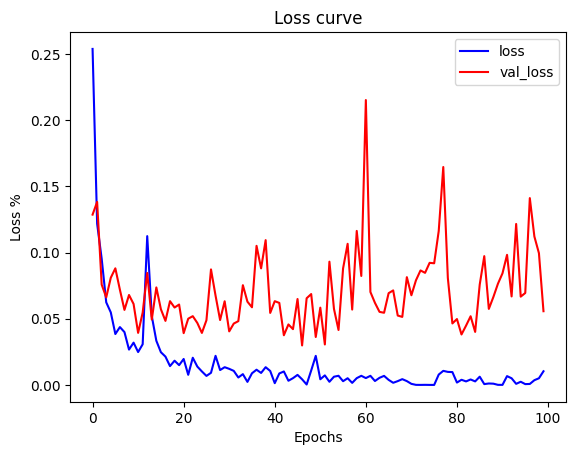

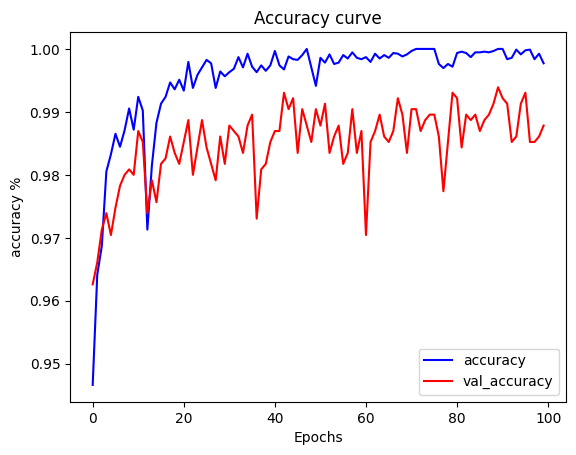





---- conv layers = 6-------
Epoch 1/100
288/288 [==============================] - 18s 40ms/step - loss: 0.1769 - accuracy: 0.9490 - val_loss: 0.1042 - val_accuracy: 0.9696
Epoch 2/100
288/288 [==============================] - 11s 37ms/step - loss: 0.0928 - accuracy: 0.9659 - val_loss: 0.0845 - val_accuracy: 0.9661
Epoch 3/100
288/288 [==============================] - 11s 37ms/step - loss: 0.0857 - accuracy: 0.9733 - val_loss: 0.1002 - val_accuracy: 0.9678
Epoch 4/100
288/288 [==============================] - 11s 37ms/step - loss: 0.0671 - accuracy: 0.9789 - val_loss: 0.0856 - val_accuracy: 0.9739
Epoch 5/100
288/288 [==============================] - 11s 36ms/step - loss: 0.0755 - accuracy: 0.9736 - val_loss: 0.0541 - val_accuracy: 0.9783
Epoch 6/100
288/288 [==============================] - 10s 36ms/step - loss: 0.0461 - accuracy: 0.9839 - val_loss: 0.0611 - val_accuracy: 0.9783
Epoch 7/100
288/288 [==============================] - 10s 36ms/step - loss: 0.0383 - accuracy: 0.

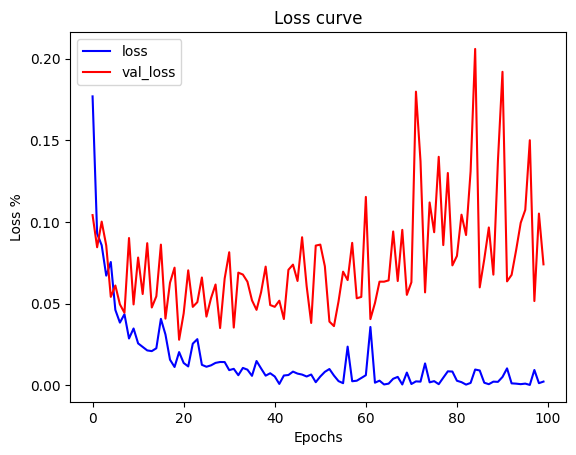

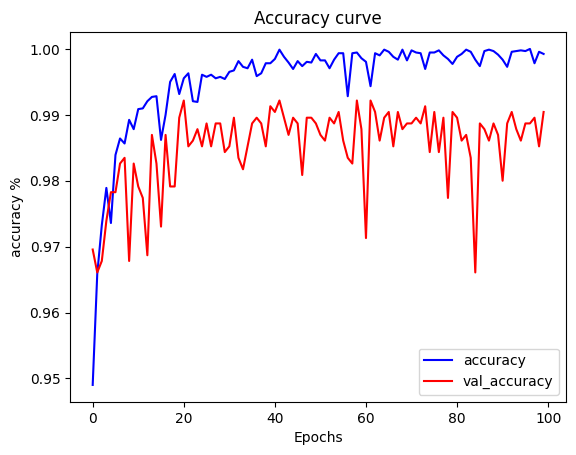





---- conv layers = 7-------
Epoch 1/100


ValueError: ignored

In [ ]:
all_conv_layers = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]



all_layers_history = []
all_layers_models = []

for conv_layers in all_conv_layers:
    model = eegClassifier(input_shape, conv_layers)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    print('\n\n\n')
    print(f'---- conv layers = {conv_layers}-------')
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)
    all_layers_models.append(model)
    print('\n\n')
    print(model.summary())
    print('\n')
    plot_loss(history)
    plot_accuracy(history)

    all_layers_history.append(history)


## Let's experiment with the number of dense layers

```
layers = [1, 2, 3, 4, 5, 6]


```


In [ ]:
class eegClassifier(keras.Model):
    def __init__(self, input_shape, dense_layers):
        super(eegClassifier, self).__init__()

        self.conv1 = layers.Conv1D(filters=128, kernel_size=6, input_shape=input_shape)
        self.bn_1 = BatchNormalization()
        self.max_pool_1 = layers.MaxPooling1D(2, padding='same')

        self.conv2 = layers.Conv1D(filters=512, kernel_size=3)
        self.bn_2 = BatchNormalization()
        self.max_pool_2 = layers.MaxPooling1D(2, padding='same')

        self.flatten = Flatten()

        self.dense_layers = []
        for i in range(dense_layers):
            units = 512 // (2**i)
            dense_layer = Dense(units)
            self.dense_layers.append(dense_layer)
        self.output_dense = Dense(2, activation='softmax')

    def call(self, inputs):
        x = self.conv1(inputs)
        x = tf.nn.relu(self.bn_1(x))
        x = self.max_pool_1(x)

        x = self.conv2(x)
        x = tf.nn.relu(self.bn_2(x))
        x = self.max_pool_2(x)

        x = self.flatten(x)

        for i in range(len(self.dense_layers)):
            x = self.dense_layers[i](x)

        return self.output_dense(x)






---- dense layers = 1-------
Epoch 1/100
288/288 [==============================] - 5s 9ms/step - loss: 2.1495 - accuracy: 0.9312 - val_loss: 0.1675 - val_accuracy: 0.9574
Epoch 2/100
288/288 [==============================] - 2s 9ms/step - loss: 0.1615 - accuracy: 0.9458 - val_loss: 0.1790 - val_accuracy: 0.9452
Epoch 3/100
288/288 [==============================] - 2s 9ms/step - loss: 0.1621 - accuracy: 0.9479 - val_loss: 0.1656 - val_accuracy: 0.9357
Epoch 4/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1593 - accuracy: 0.9499 - val_loss: 0.1448 - val_accuracy: 0.9565
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1418 - accuracy: 0.9525 - val_loss: 0.1418 - val_accuracy: 0.9452
Epoch 6/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1407 - accuracy: 0.9550 - val_loss: 0.1347 - val_accuracy: 0.9600
Epoch 7/100
288/288 [==============================] - 2s 9ms/step - loss: 0.1870 - accuracy: 0.9479 - val_lo

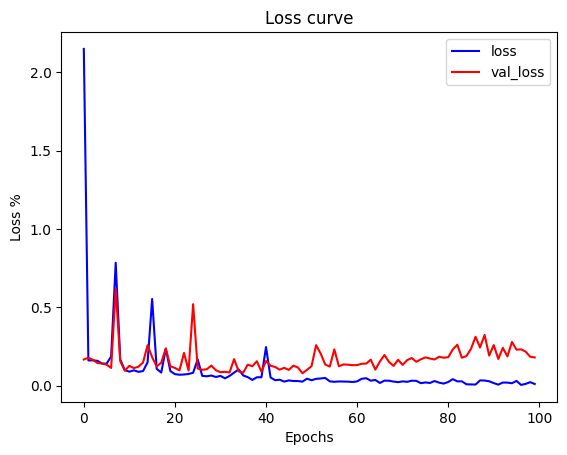

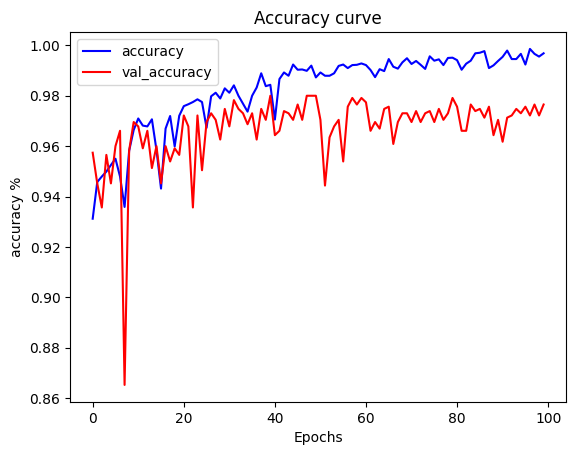





---- dense layers = 2-------
Epoch 1/100
288/288 [==============================] - 6s 11ms/step - loss: 2.1420 - accuracy: 0.9213 - val_loss: 0.4773 - val_accuracy: 0.9426
Epoch 2/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1786 - accuracy: 0.9443 - val_loss: 0.1618 - val_accuracy: 0.9504
Epoch 3/100
288/288 [==============================] - 3s 9ms/step - loss: 0.3536 - accuracy: 0.9390 - val_loss: 0.1836 - val_accuracy: 0.9435
Epoch 4/100
288/288 [==============================] - 3s 9ms/step - loss: 3.1553 - accuracy: 0.9216 - val_loss: 0.3992 - val_accuracy: 0.9426
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1669 - accuracy: 0.9468 - val_loss: 0.1548 - val_accuracy: 0.9400
Epoch 6/100
288/288 [==============================] - 3s 10ms/step - loss: 0.1444 - accuracy: 0.9508 - val_loss: 0.1904 - val_accuracy: 0.9470
Epoch 7/100
288/288 [==============================] - 3s 9ms/step - loss: 0.1384 - accuracy: 0.9528 - val_

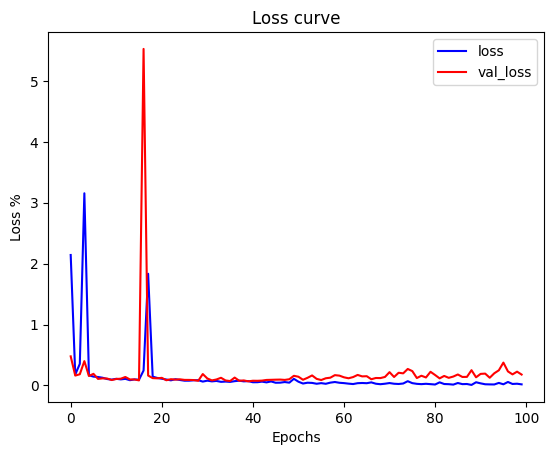

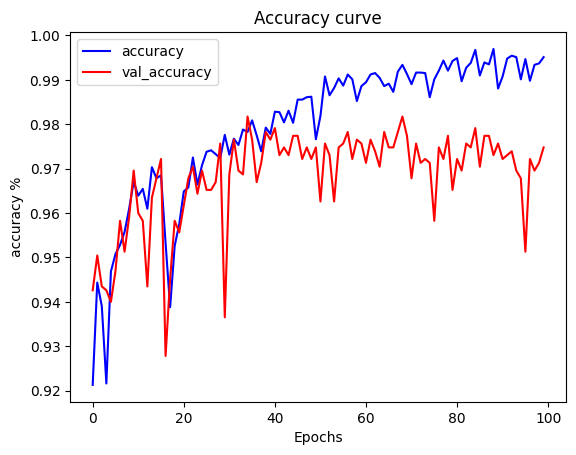





---- dense layers = 3-------
Epoch 1/100
288/288 [==============================] - 6s 10ms/step - loss: 3.1773 - accuracy: 0.9186 - val_loss: 0.1895 - val_accuracy: 0.9530
Epoch 2/100
288/288 [==============================] - 3s 10ms/step - loss: 0.2260 - accuracy: 0.9450 - val_loss: 0.2566 - val_accuracy: 0.9400
Epoch 3/100
288/288 [==============================] - 3s 10ms/step - loss: 0.5673 - accuracy: 0.9355 - val_loss: 0.6934 - val_accuracy: 0.9261
Epoch 4/100
288/288 [==============================] - 3s 9ms/step - loss: 0.2948 - accuracy: 0.9433 - val_loss: 0.3069 - val_accuracy: 0.9487
Epoch 5/100
288/288 [==============================] - 3s 9ms/step - loss: 0.4108 - accuracy: 0.9393 - val_loss: 0.3420 - val_accuracy: 0.9626
Epoch 6/100
288/288 [==============================] - 3s 9ms/step - loss: 0.2491 - accuracy: 0.9517 - val_loss: 0.1950 - val_accuracy: 0.9374
Epoch 7/100
288/288 [==============================] - 3s 10ms/step - loss: 0.1217 - accuracy: 0.9634 - va

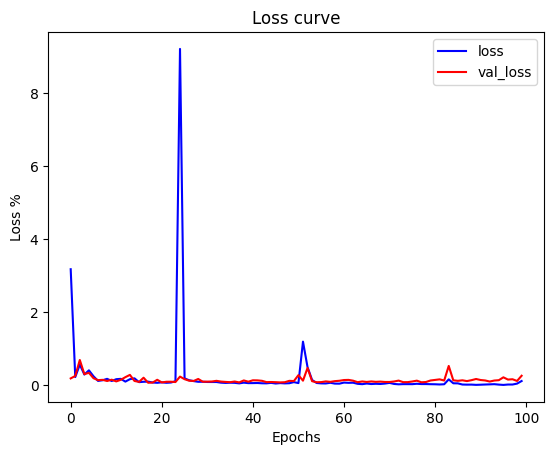

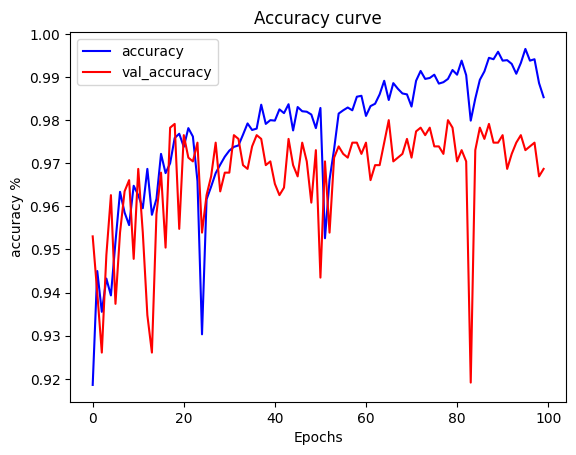





---- dense layers = 4-------
Epoch 1/100
288/288 [==============================] - 7s 11ms/step - loss: 1.7948 - accuracy: 0.9201 - val_loss: 0.1904 - val_accuracy: 0.9539
Epoch 2/100
288/288 [==============================] - 3s 10ms/step - loss: 0.2069 - accuracy: 0.9455 - val_loss: 0.2269 - val_accuracy: 0.9287
Epoch 3/100
288/288 [==============================] - 3s 10ms/step - loss: 0.1316 - accuracy: 0.9557 - val_loss: 0.1232 - val_accuracy: 0.9513
Epoch 4/100
288/288 [==============================] - 3s 10ms/step - loss: 0.2049 - accuracy: 0.9486 - val_loss: 0.5661 - val_accuracy: 0.8957
Epoch 5/100
288/288 [==============================] - 3s 10ms/step - loss: 0.1911 - accuracy: 0.9505 - val_loss: 0.1475 - val_accuracy: 0.9530
Epoch 6/100
288/288 [==============================] - 3s 10ms/step - loss: 0.2305 - accuracy: 0.9527 - val_loss: 0.2617 - val_accuracy: 0.9600
Epoch 7/100
288/288 [==============================] - 3s 10ms/step - loss: 0.1763 - accuracy: 0.9536 -

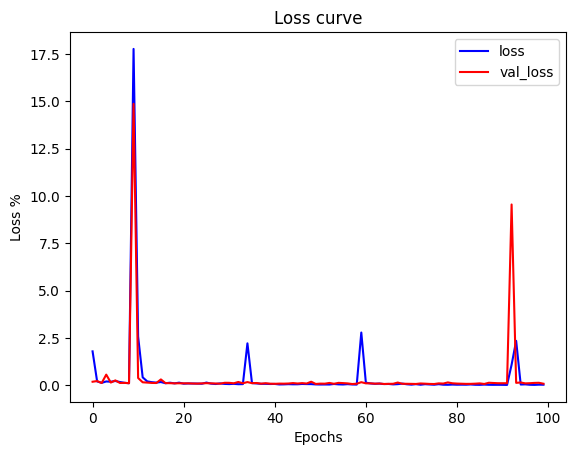

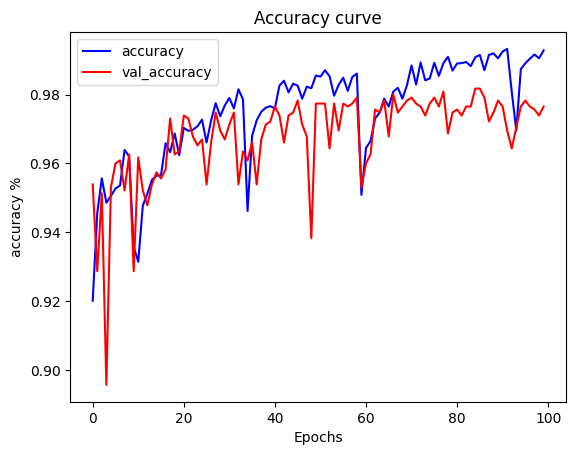





---- dense layers = 5-------
Epoch 1/100
288/288 [==============================] - 7s 12ms/step - loss: 2.3161 - accuracy: 0.9220 - val_loss: 0.1967 - val_accuracy: 0.9409
Epoch 2/100
288/288 [==============================] - 3s 11ms/step - loss: 0.1635 - accuracy: 0.9438 - val_loss: 0.1971 - val_accuracy: 0.9417
Epoch 3/100
288/288 [==============================] - 3s 10ms/step - loss: 0.1696 - accuracy: 0.9464 - val_loss: 0.1388 - val_accuracy: 0.9504
Epoch 4/100
288/288 [==============================] - 3s 10ms/step - loss: 20.0171 - accuracy: 0.9138 - val_loss: 4.1972 - val_accuracy: 0.9383
Epoch 5/100
288/288 [==============================] - 3s 10ms/step - loss: 0.6492 - accuracy: 0.9342 - val_loss: 0.3026 - val_accuracy: 0.9470
Epoch 6/100
288/288 [==============================] - 3s 11ms/step - loss: 0.2273 - accuracy: 0.9472 - val_loss: 0.2613 - val_accuracy: 0.9313
Epoch 7/100
288/288 [==============================] - 3s 10ms/step - loss: 0.1740 - accuracy: 0.9458 

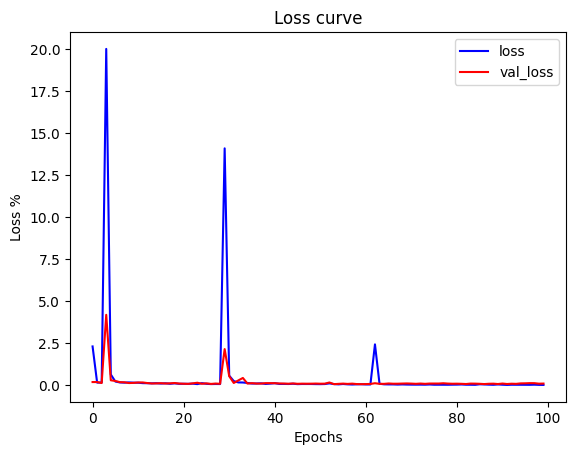

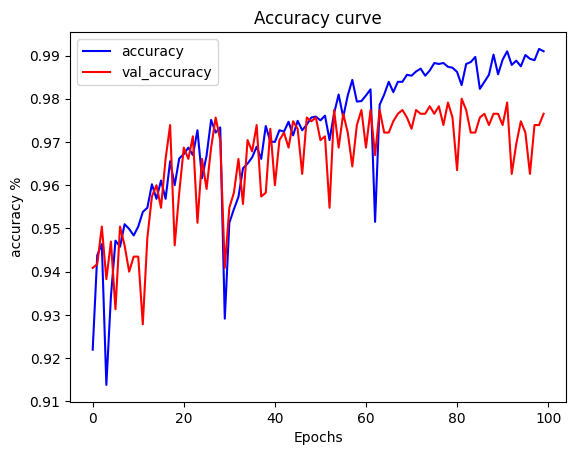





---- dense layers = 6-------
Epoch 1/100
288/288 [==============================] - 7s 12ms/step - loss: 2.2135 - accuracy: 0.9274 - val_loss: 0.2793 - val_accuracy: 0.9409
Epoch 2/100
288/288 [==============================] - 3s 11ms/step - loss: 0.1816 - accuracy: 0.9497 - val_loss: 0.1486 - val_accuracy: 0.9374
Epoch 3/100
288/288 [==============================] - 3s 10ms/step - loss: 0.2579 - accuracy: 0.9436 - val_loss: 0.3824 - val_accuracy: 0.9365
Epoch 4/100
288/288 [==============================] - 3s 10ms/step - loss: 0.3094 - accuracy: 0.9460 - val_loss: 0.6560 - val_accuracy: 0.9470
Epoch 5/100
288/288 [==============================] - 3s 10ms/step - loss: 0.2213 - accuracy: 0.9512 - val_loss: 0.1220 - val_accuracy: 0.9600
Epoch 6/100
288/288 [==============================] - 3s 11ms/step - loss: 0.1299 - accuracy: 0.9588 - val_loss: 0.1177 - val_accuracy: 0.9774
Epoch 7/100
288/288 [==============================] - 3s 10ms/step - loss: 0.1007 - accuracy: 0.9670 -

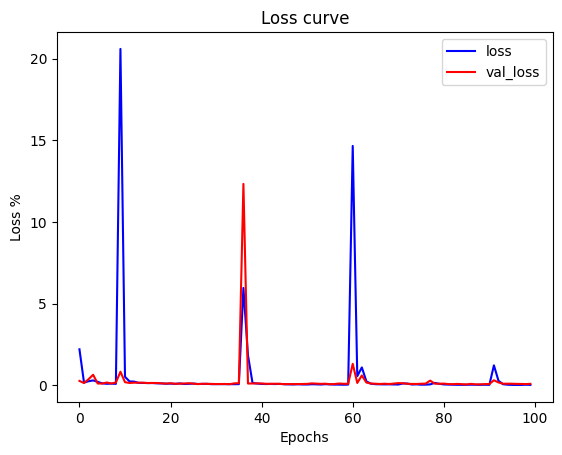

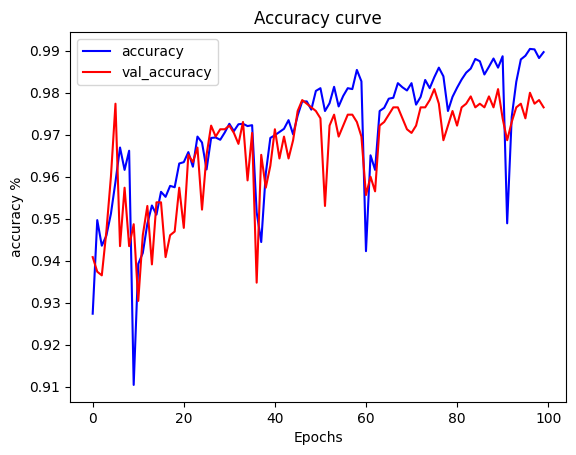

In [ ]:
dlayers = [1, 2, 3, 4, 5, 6]



all_dlayers_history = []
all_dlayers_models = []

for dense_layers in dlayers:
    model = eegClassifier(input_shape, dense_layers)
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    print('\n\n\n')
    print(f'---- dense layers = {dense_layers}-------')
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=100)
    all_dlayers_models.append(model)
    print('\n\n')
    print(model.summary())
    print('\n')
    plot_loss(history)
    plot_accuracy(history)

    all_dlayers_history.append(history)
